# Importing Libraries and Data

In [1]:
# Import basic libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Import preprocessing and evaluation modules
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Import machine learning models
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.svm import SVR

In [2]:
df = pd.read_csv("CarPrice_Assignment (2).csv")

In [3]:
df.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [4]:
df.tail()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
200,201,-1,volvo 145e (sw),gas,std,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845.0
201,202,-1,volvo 144ea,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045.0
202,203,-1,volvo 244dl,gas,std,four,sedan,rwd,front,109.1,...,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485.0
203,204,-1,volvo 246,diesel,turbo,four,sedan,rwd,front,109.1,...,145,idi,3.01,3.40,23.0,106,4800,26,27,22470.0
204,205,-1,volvo 264gl,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114,5400,19,25,22625.0


# Data Cleaning and Preprocessing

In [5]:
df.shape

(205, 26)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            205 non-null    int64  
 1   symboling         205 non-null    int64  
 2   CarName           205 non-null    object 
 3   fueltype          205 non-null    object 
 4   aspiration        205 non-null    object 
 5   doornumber        205 non-null    object 
 6   carbody           205 non-null    object 
 7   drivewheel        205 non-null    object 
 8   enginelocation    205 non-null    object 
 9   wheelbase         205 non-null    float64
 10  carlength         205 non-null    float64
 11  carwidth          205 non-null    float64
 12  carheight         205 non-null    float64
 13  curbweight        205 non-null    int64  
 14  enginetype        205 non-null    object 
 15  cylindernumber    205 non-null    object 
 16  enginesize        205 non-null    int64  
 1

In [7]:
df.isnull().sum()

car_ID              0
symboling           0
CarName             0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
wheelbase           0
carlength           0
carwidth            0
carheight           0
curbweight          0
enginetype          0
cylindernumber      0
enginesize          0
fuelsystem          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
price               0
dtype: int64

In [8]:
df.duplicated().sum()

0

In [9]:
df.describe()

,car_ID,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,103.000000,0.834146,98.756585,174.049268,65.907805,53.724878,2555.565854,126.907317,3.329756,3.255415,10.142537,104.117073,5125.121951,25.219512,30.751220,13276.710571
std,59.322565,1.245307,6.021776,12.337289,2.145204,2.443522,520.680204,41.642693,0.270844,0.313597,3.972040,39.544167,476.985643,6.542142,6.886443,7988.852332
min,1.000000,-2.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,2.540000,2.070000,7.000000,48.000000,4150.000000,13.000000,16.000000,5118.000000
25%,52.000000,0.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,3.150000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7788.000000
50%,103.000000,1.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10295.000000
75%,154.000000,2.000000,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,3.580000,3.410000,9.400000,116.000000,5500.000000,30.000000,34.000000,16503.000000
max,205.000000,3.000000,120.900000,208.100000,72.300000,59.800000,4066.000000,326.000000,3.940000,4.170000,23.000000,288.000000,6600.000000,49.000000,54.000000,45400.000000


In [10]:
# Check for missing values
print(df.isnull().sum())

# Splitting CarName into CarBrand and Model
df[['CarBrand', 'Model']] = df['CarName'].str.split(' ', 1, expand=True)

# Drop 'CarName' column if 'CarBrand' and 'Model' are sufficient
df = df.drop(['CarName'], axis=1)

car_ID              0
symboling           0
CarName             0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
wheelbase           0
carlength           0
carwidth            0
carheight           0
curbweight          0
enginetype          0
cylindernumber      0
enginesize          0
fuelsystem          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
price               0
dtype: int64


C:\Users\KIIT\AppData\Local\Temp\ipykernel_3872\2159545075.py:5: FutureWarning: In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.
  df[['CarBrand', 'Model']] = df['CarName'].str.split(' ', 1, expand=True)


In [11]:
df.drop('Model', axis=1, inplace=True)

In [12]:
df

,car_ID,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,...,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price,CarBrand
0,1,3,gas,std,two,convertible,rwd,front,88.6,168.8,...,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0,alfa-romero
1,2,3,gas,std,two,convertible,rwd,front,88.6,168.8,...,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0,alfa-romero
2,3,1,gas,std,two,hatchback,rwd,front,94.5,171.2,...,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0,alfa-romero
3,4,2,gas,std,four,sedan,fwd,front,99.8,176.6,...,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0,audi
4,5,2,gas,std,four,sedan,4wd,front,99.4,176.6,...,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0,audi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,201,-1,gas,std,four,sedan,rwd,front,109.1,188.8,...,mpfi,3.78,3.15,9.5,114,5400,23,28,16845.0,volvo
201,202,-1,gas,turbo,four,sedan,rwd,front,109.1,188.8,...,mpfi,3.78,3.15,8.7,160,5300,19,25,19045.0,volvo
202,203,-1,gas,std,four,sedan,rwd,front,109.1,188.8,...,mpfi,3.58,2.87,8.8,134,5500,18,23,21485.0,volvo
203,204,-1,diesel,turbo,four,sedan,rwd,front,109.1,188.8,...,idi,3.01,3.40,23.0,106,4800,26,27,22470.0,volvo


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            205 non-null    int64  
 1   symboling         205 non-null    int64  
 2   fueltype          205 non-null    object 
 3   aspiration        205 non-null    object 
 4   doornumber        205 non-null    object 
 5   carbody           205 non-null    object 
 6   drivewheel        205 non-null    object 
 7   enginelocation    205 non-null    object 
 8   wheelbase         205 non-null    float64
 9   carlength         205 non-null    float64
 10  carwidth          205 non-null    float64
 11  carheight         205 non-null    float64
 12  curbweight        205 non-null    int64  
 13  enginetype        205 non-null    object 
 14  cylindernumber    205 non-null    object 
 15  enginesize        205 non-null    int64  
 16  fuelsystem        205 non-null    object 
 1

In [14]:
df['fuelsystem'].value_counts()

mpfi    94
2bbl    66
idi     20
1bbl    11
spdi     9
4bbl     3
mfi      1
spfi     1
Name: fuelsystem, dtype: int64

In [15]:
df['aspiration'].value_counts()

std      168
turbo     37
Name: aspiration, dtype: int64

In [16]:
df['doornumber'].value_counts()

four    115
two      90
Name: doornumber, dtype: int64

In [17]:
df['carbody'].value_counts()

sedan          96
hatchback      70
wagon          25
hardtop         8
convertible     6
Name: carbody, dtype: int64

In [18]:
df['drivewheel'].value_counts()

fwd    120
rwd     76
4wd      9
Name: drivewheel, dtype: int64

In [19]:
df['enginelocation'].value_counts()

front    202
rear       3
Name: enginelocation, dtype: int64

In [20]:
df['enginetype'].value_counts()

ohc      148
ohcf      15
ohcv      13
dohc      12
l         12
rotor      4
dohcv      1
Name: enginetype, dtype: int64

In [21]:
df['cylindernumber'].value_counts()

four      159
six        24
five       11
eight       5
two         4
three       1
twelve      1
Name: cylindernumber, dtype: int64

In [22]:
df['fueltype'].value_counts()

gas       185
diesel     20
Name: fueltype, dtype: int64

In [23]:
df['CarBrand'].value_counts()

toyota         31
nissan         17
mazda          15
honda          13
mitsubishi     13
subaru         12
peugeot        11
volvo          11
volkswagen      9
dodge           9
buick           8
bmw             8
audi            7
plymouth        7
saab            6
isuzu           4
porsche         4
alfa-romero     3
chevrolet       3
jaguar          3
vw              2
maxda           2
renault         2
toyouta         1
vokswagen       1
Nissan          1
mercury         1
porcshce        1
Name: CarBrand, dtype: int64

In [24]:
# Standardize car brand names in the CarBrand column using inplace=True
df['CarBrand'].replace({
    'maxda': 'Mazda',
    'mazda': 'Mazda',
    'nissan': 'Nissan',
    'Nissan': 'Nissan',
    'porsche': 'Porsche',
    'porcshce': 'Porsche',
    'toyota': 'Toyota',
    'toyouta': 'Toyota',
    'vokswagen': 'Volkswagen',
    'volkswagen': 'Volkswagen',
    'vw': 'Volkswagen'
}, inplace=True)

# Verify the changes
print(df['CarBrand'].value_counts())


Toyota         32
Nissan         18
Mazda          17
mitsubishi     13
honda          13
Volkswagen     12
subaru         12
peugeot        11
volvo          11
dodge           9
buick           8
bmw             8
audi            7
plymouth        7
saab            6
Porsche         5
isuzu           4
jaguar          3
chevrolet       3
alfa-romero     3
renault         2
mercury         1
Name: CarBrand, dtype: int64


# EDA (Univariate Analysis)

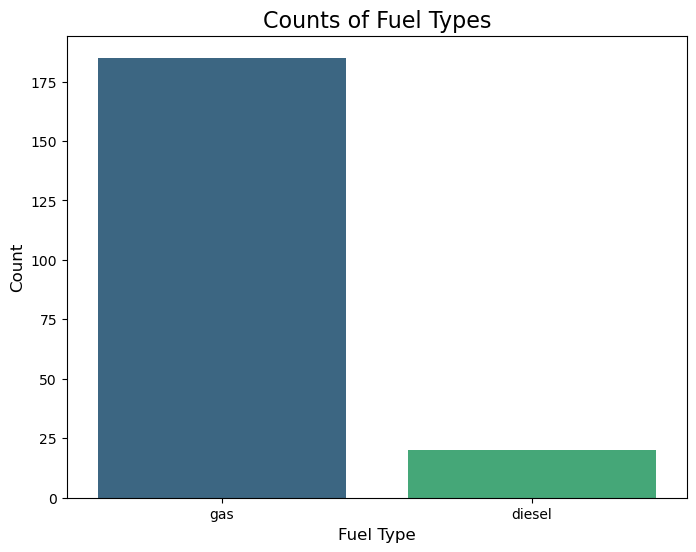

In [25]:
# Bar graph for 'fueltype' counts
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='fueltype', palette='viridis')

# Adding titles and labels
plt.title('Counts of Fuel Types', fontsize=16)
plt.xlabel('Fuel Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Display the plot
plt.show()

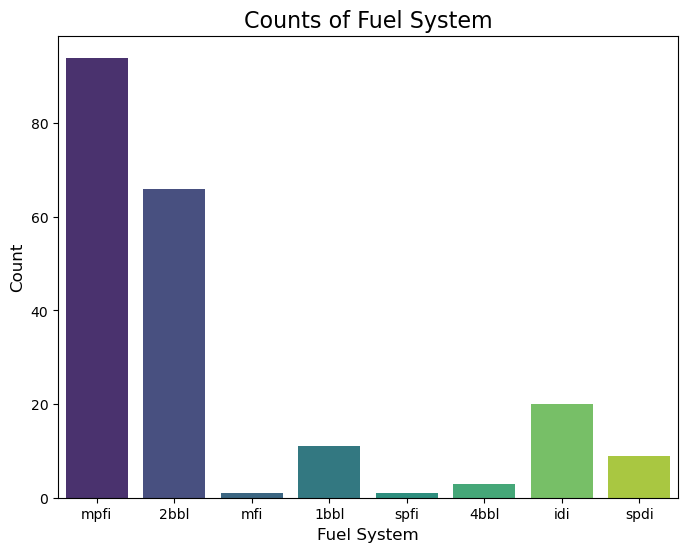

In [26]:
# Bar graph for 'fuelsystem' counts
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='fuelsystem', palette='viridis')

# Adding titles and labels
plt.title('Counts of Fuel System', fontsize=16)
plt.xlabel('Fuel System', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Display the plot
plt.show()

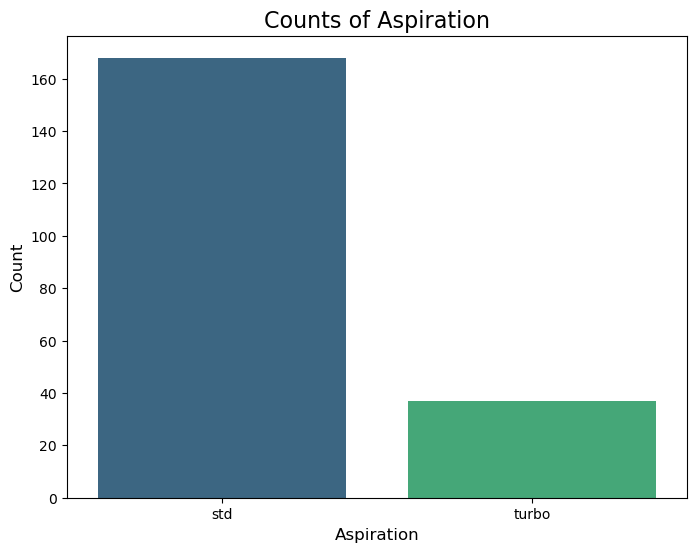

In [27]:
# Bar graph for 'aspiration' counts
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='aspiration', palette='viridis')

# Adding titles and labels
plt.title('Counts of Aspiration', fontsize=16)
plt.xlabel('Aspiration', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Display the plot
plt.show()

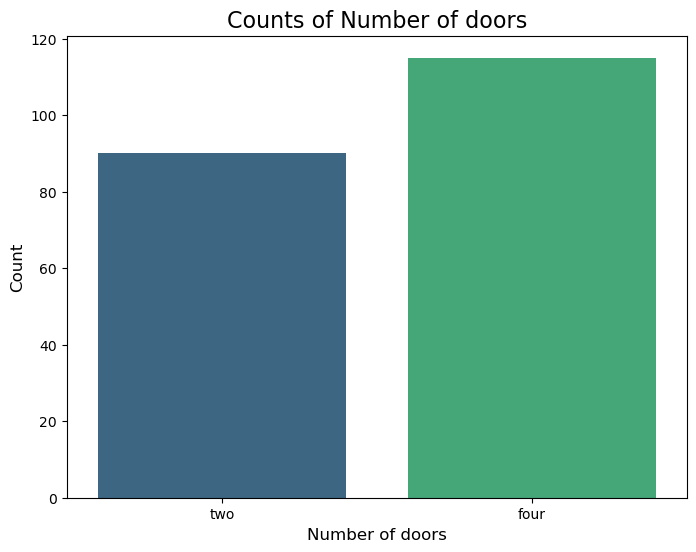

In [28]:
# Bar graph for 'doornumber' counts
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='doornumber', palette='viridis')

# Adding titles and labels
plt.title('Counts of Number of doors', fontsize=16)
plt.xlabel('Number of doors', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Display the plot
plt.show()

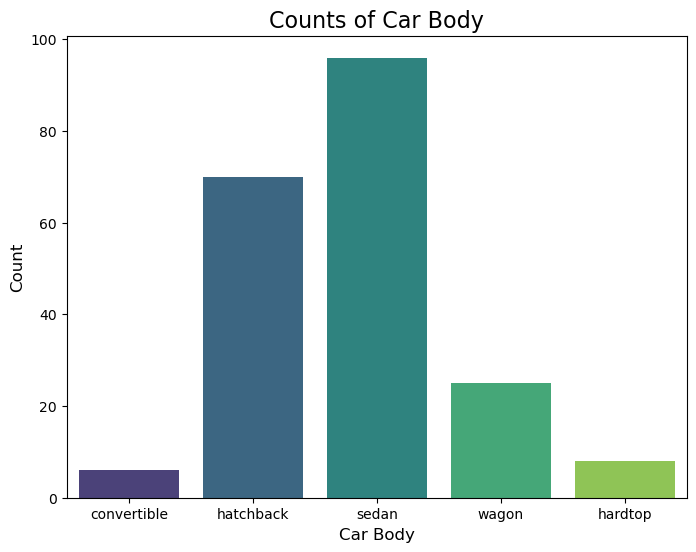

In [29]:
# Bar graph for 'carbody' counts
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='carbody', palette='viridis')

# Adding titles and labels
plt.title('Counts of Car Body', fontsize=16)
plt.xlabel('Car Body', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Display the plot
plt.show()

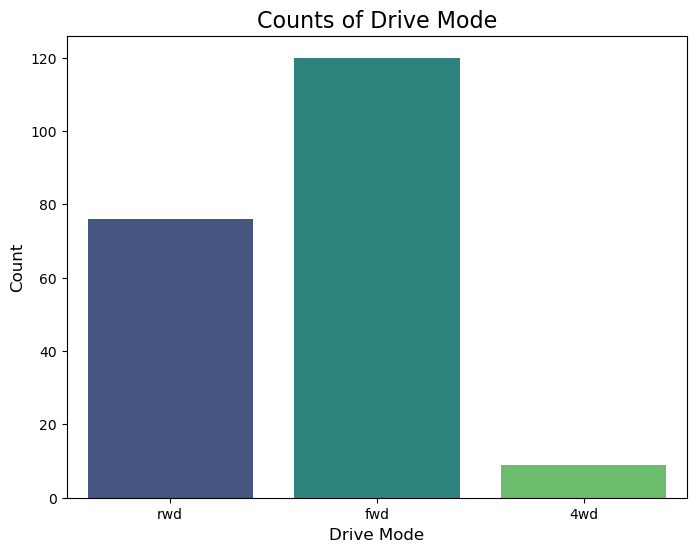

In [30]:
# Bar graph for 'drivewheel' counts
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='drivewheel', palette='viridis')

# Adding titles and labels
plt.title('Counts of Drive Mode', fontsize=16)
plt.xlabel('Drive Mode', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Display the plot
plt.show()

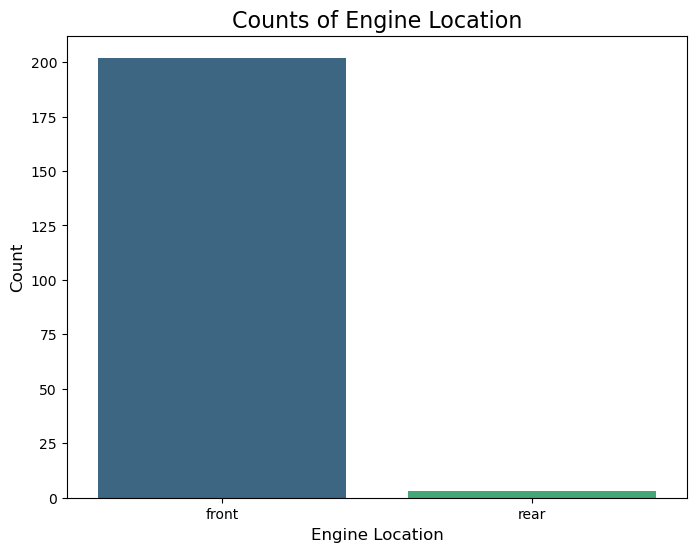

In [31]:
# Bar graph for 'enginelocation' counts
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='enginelocation', palette='viridis')

# Adding titles and labels
plt.title('Counts of Engine Location', fontsize=16)
plt.xlabel('Engine Location', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Display the plot
plt.show()

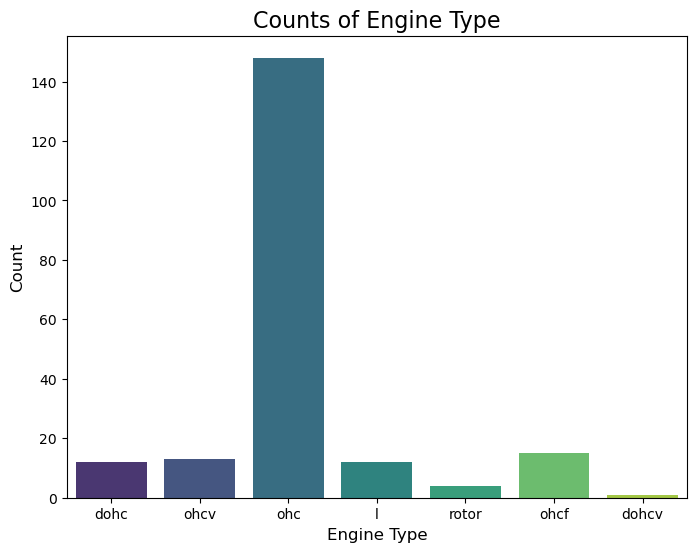

In [32]:
# Bar graph for 'enginetype' counts
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='enginetype', palette='viridis')

# Adding titles and labels
plt.title('Counts of Engine Type', fontsize=16)
plt.xlabel('Engine Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Display the plot
plt.show()

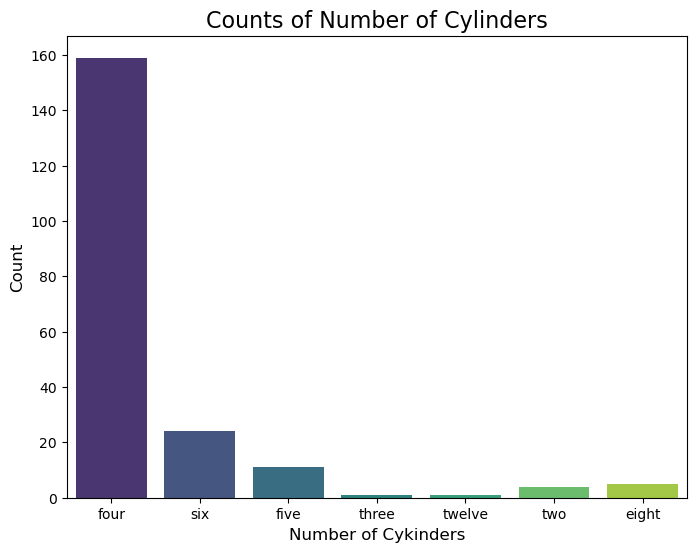

In [33]:
# Bar graph for 'cylindernumber' counts
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='cylindernumber', palette='viridis')

# Adding titles and labels
plt.title('Counts of Number of Cylinders', fontsize=16)
plt.xlabel('Number of Cykinders', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Display the plot
plt.show()

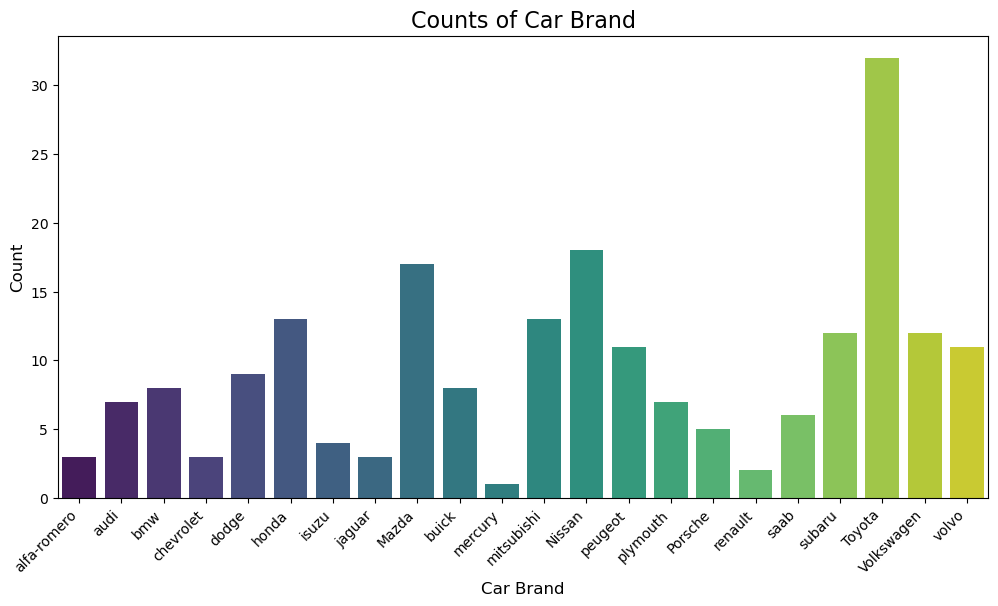

In [34]:
# Bar graph for 'CarBrandCarBrand' counts
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='CarBrand', palette='viridis')

# Adding titles and labels
plt.title('Counts of Car Brand', fontsize=16)
plt.xlabel('Car Brand', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45, fontsize=10, ha='right')  # Rotate by 45 degrees and align right
plt.yticks(fontsize=10)

# Display the plot
plt.show()

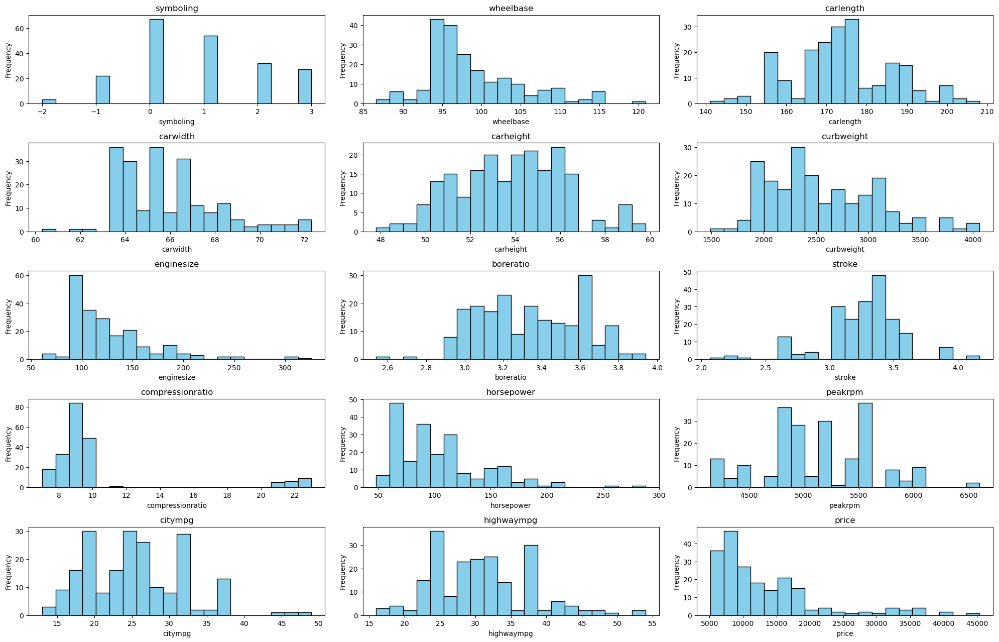

hello world


In [35]:
# Select only numerical columns
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop('car_ID')  # Exclude 'car_ID'
# Plot histograms for all numerical columns
plt.figure(figsize=(20, 15))  # Adjust the figure size for better visibility
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(len(numerical_columns) // 3 + 1, 3, i)  # Create a grid of subplots
    plt.hist(df[column], bins=20, color='skyblue', edgecolor='black')
    plt.title(column, fontsize=12)
    plt.xlabel(column, fontsize=10)
    plt.ylabel('Frequency', fontsize=10)
    plt.tight_layout()  # Adjust layout to avoid overlapping

# Display the plot
plt.show()
print("hello world")

In [36]:
# Import necessary libraries
import pandas as pd

# Numerical columns: Min, Max, Mean
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop('car_ID')
print("Numerical Columns Statistics:\n")
for column in numerical_columns:
    print(f"Column: {column}")
    print(f"  Min: {df[column].min()}")
    print(f"  Max: {df[column].max()}")
    print(f"  Mean: {df[column].mean():.2f}")
    print("-" * 40)

# Categorical columns: Mode
categorical_columns = df.select_dtypes(include=['object']).columns
print("\nCategorical Columns Mode:\n")
for column in categorical_columns:
    print(f"Column: {column}")
    print(f"  Mode: {df[column].mode()[0]}")
    print("-" * 40)


Numerical Columns Statistics:

Column: symboling
  Min: -2
  Max: 3
  Mean: 0.83
----------------------------------------
Column: wheelbase
  Min: 86.6
  Max: 120.9
  Mean: 98.76
----------------------------------------
Column: carlength
  Min: 141.1
  Max: 208.1
  Mean: 174.05
----------------------------------------
Column: carwidth
  Min: 60.3
  Max: 72.3
  Mean: 65.91
----------------------------------------
Column: carheight
  Min: 47.8
  Max: 59.8
  Mean: 53.72
----------------------------------------
Column: curbweight
  Min: 1488
  Max: 4066
  Mean: 2555.57
----------------------------------------
Column: enginesize
  Min: 61
  Max: 326
  Mean: 126.91
----------------------------------------
Column: boreratio
  Min: 2.54
  Max: 3.94
  Mean: 3.33
----------------------------------------
Column: stroke
  Min: 2.07
  Max: 4.17
  Mean: 3.26
----------------------------------------
Column: compressionratio
  Min: 7.0
  Max: 23.0
  Mean: 10.14
----------------------------------------

# EDA (Bivariate Analysis)

# Box plots and Bar plots for categorial vs numerical data

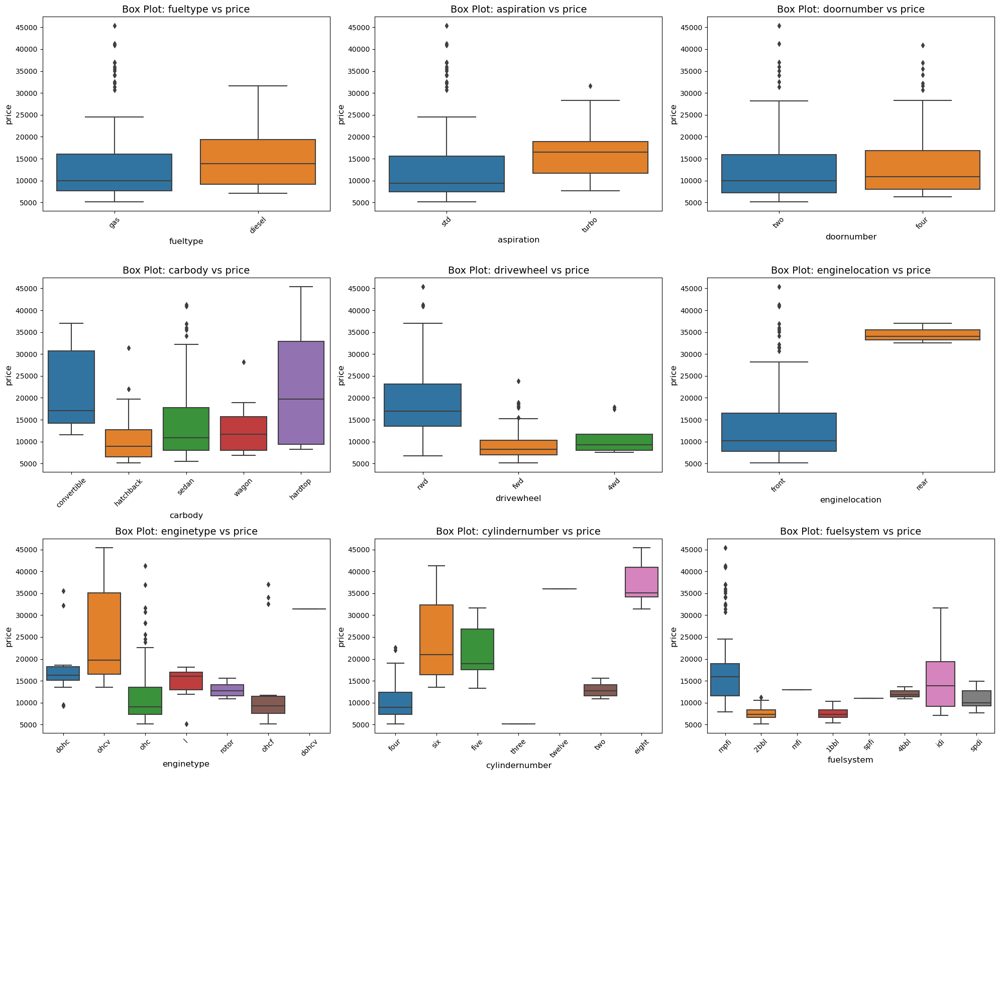

In [37]:
# Select categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns = categorical_columns.drop('CarBrand')

# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each box plot
for i, column in enumerate(categorical_columns):
    sns.boxplot(data=df, x=column, y='price', ax=axes[i])
    axes[i].set_title(f'Box Plot: {column} vs price', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('price', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

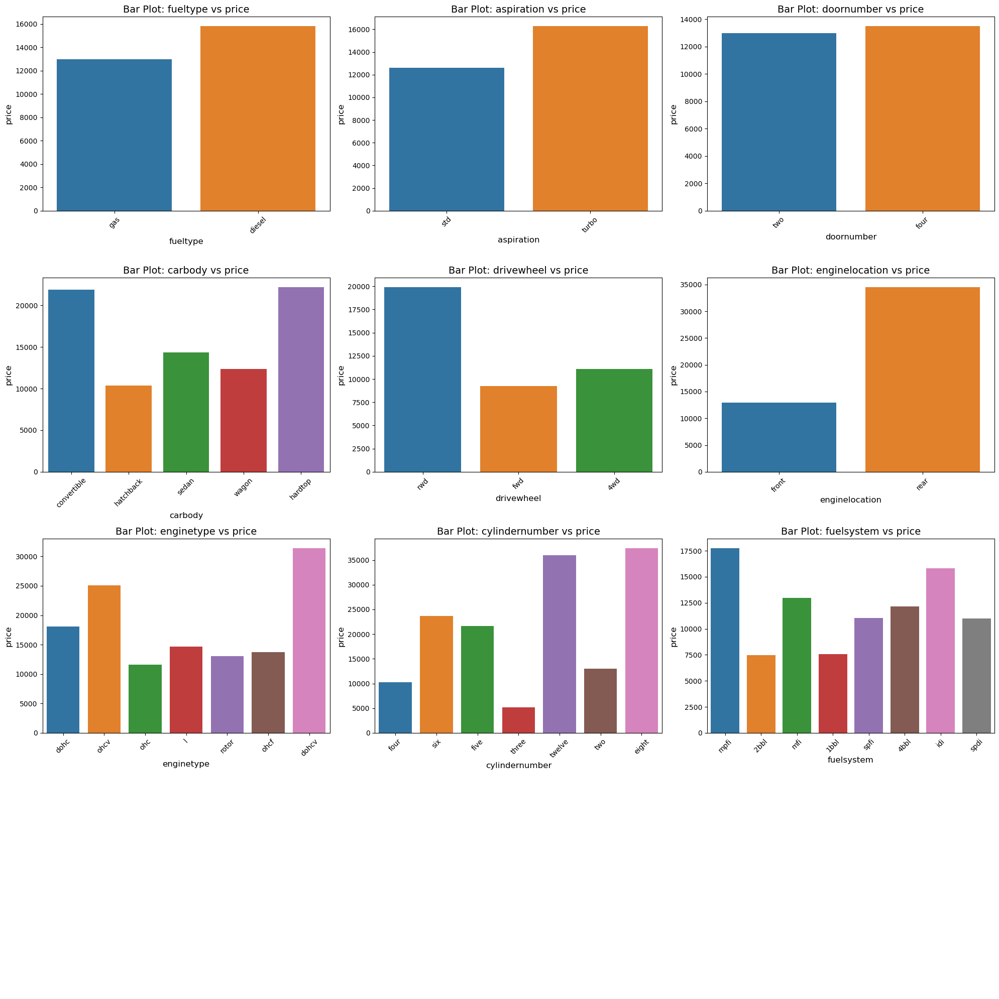

In [38]:
# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each bar plot
for i, column in enumerate(categorical_columns):
    sns.barplot(data=df, x=column, y='price', ax=axes[i], errorbar=None)  # errorbar=None removes confidence intervals
    axes[i].set_title(f'Bar Plot: {column} vs price', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('price', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


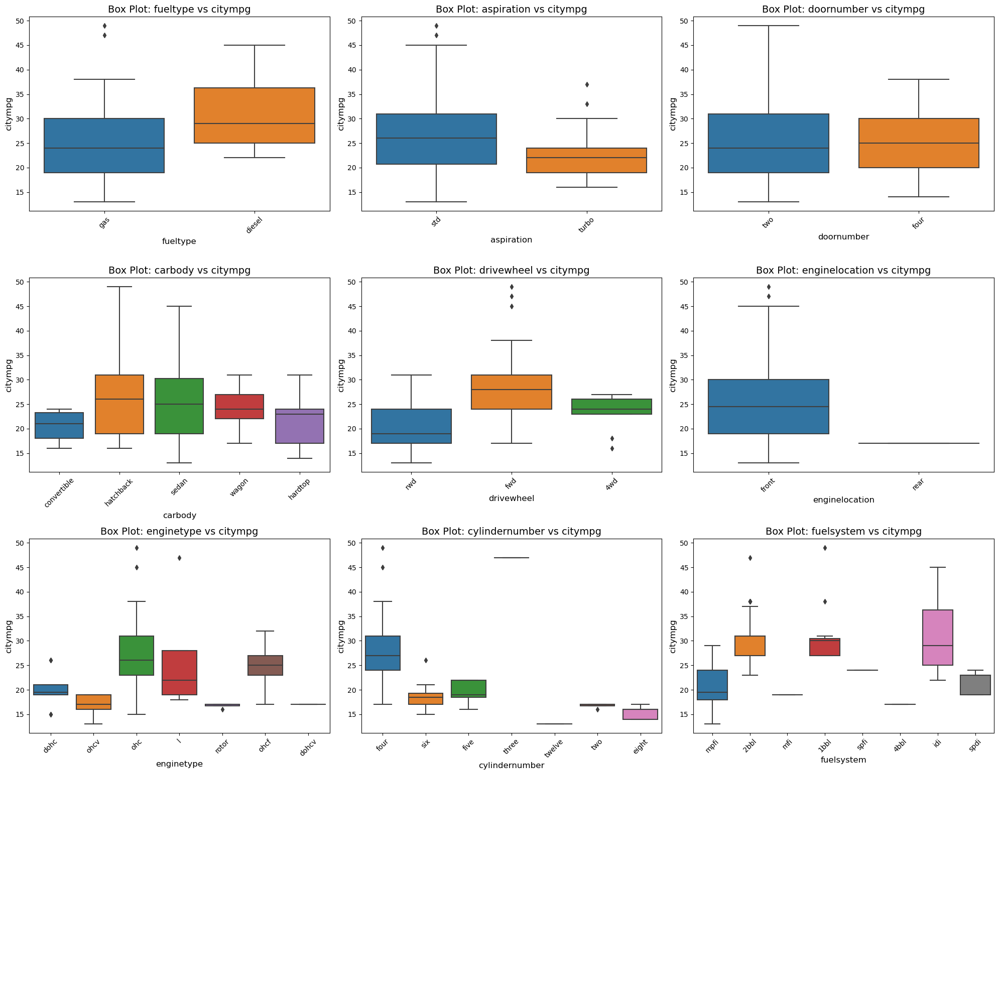

In [39]:
# Select categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns = categorical_columns.drop('CarBrand')

# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each box plot
for i, column in enumerate(categorical_columns):
    sns.boxplot(data=df, x=column, y='citympg', ax=axes[i])
    axes[i].set_title(f'Box Plot: {column} vs citympg', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('citympg', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

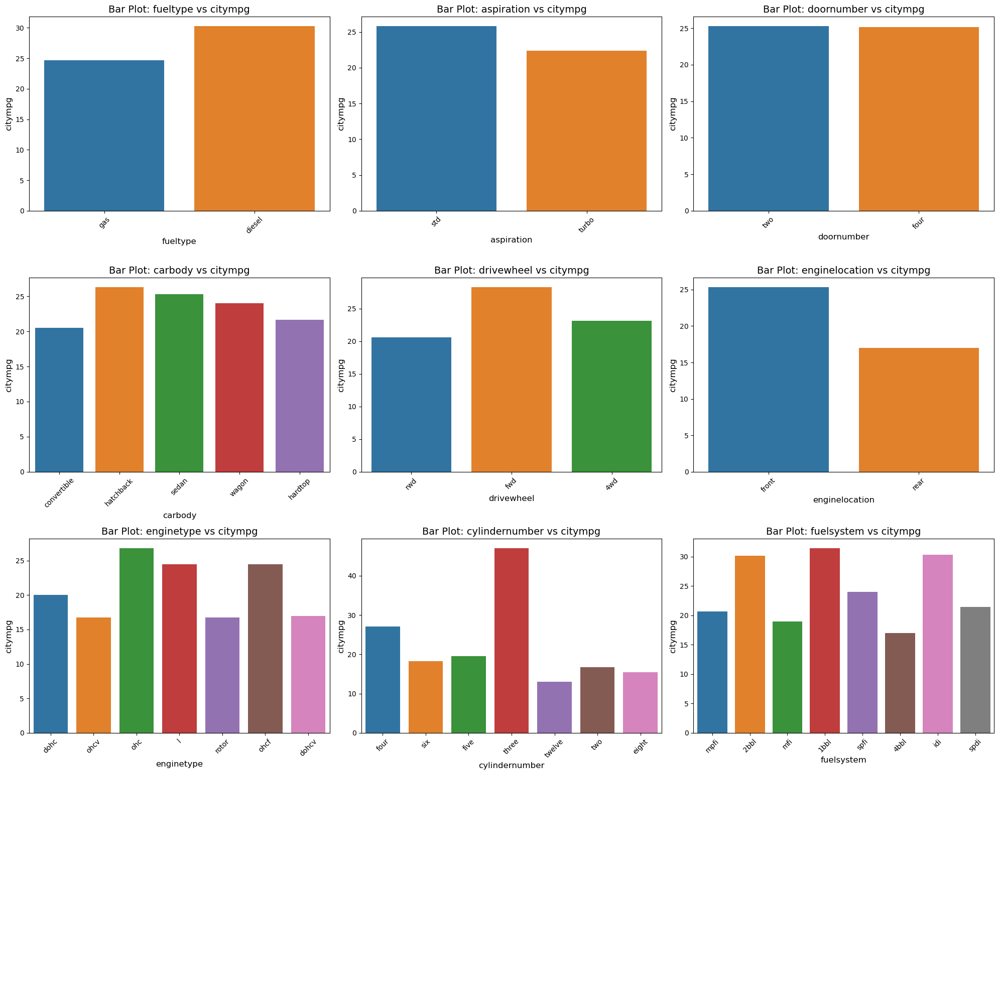

In [40]:
# Select categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns
import seaborn as sns
import matplotlib.pyplot as plt

# Select categorical columns excluding 'CarBrand'
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns = categorical_columns.drop('CarBrand')

# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each bar plot
for i, column in enumerate(categorical_columns):
    sns.barplot(data=df, x=column, y='citympg', ax=axes[i], errorbar=None)  # ci=None removes confidence intervals
    axes[i].set_title(f'Bar Plot: {column} vs citympg', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('citympg', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

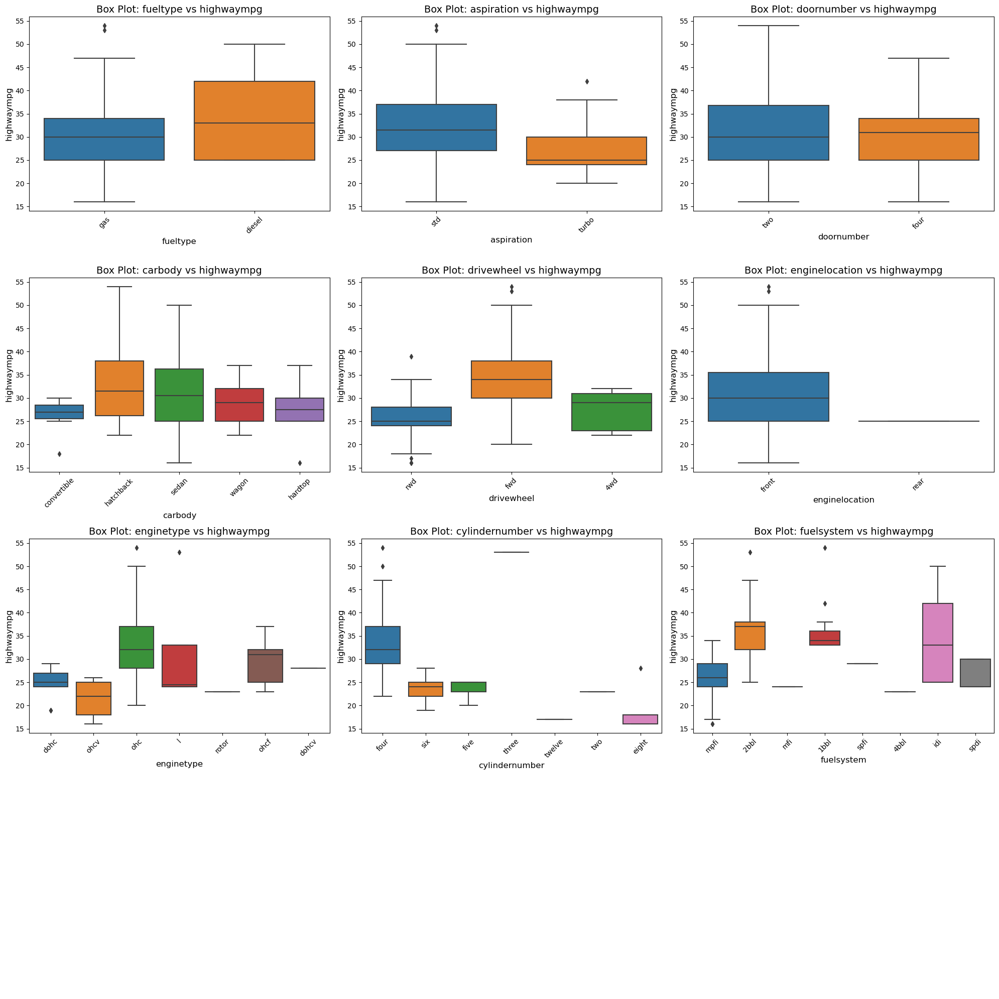

In [41]:
# Select categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns = categorical_columns.drop('CarBrand')

# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each box plot
for i, column in enumerate(categorical_columns):
    sns.boxplot(data=df, x=column, y='highwaympg', ax=axes[i])
    axes[i].set_title(f'Box Plot: {column} vs highwaympg', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('highwaympg', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

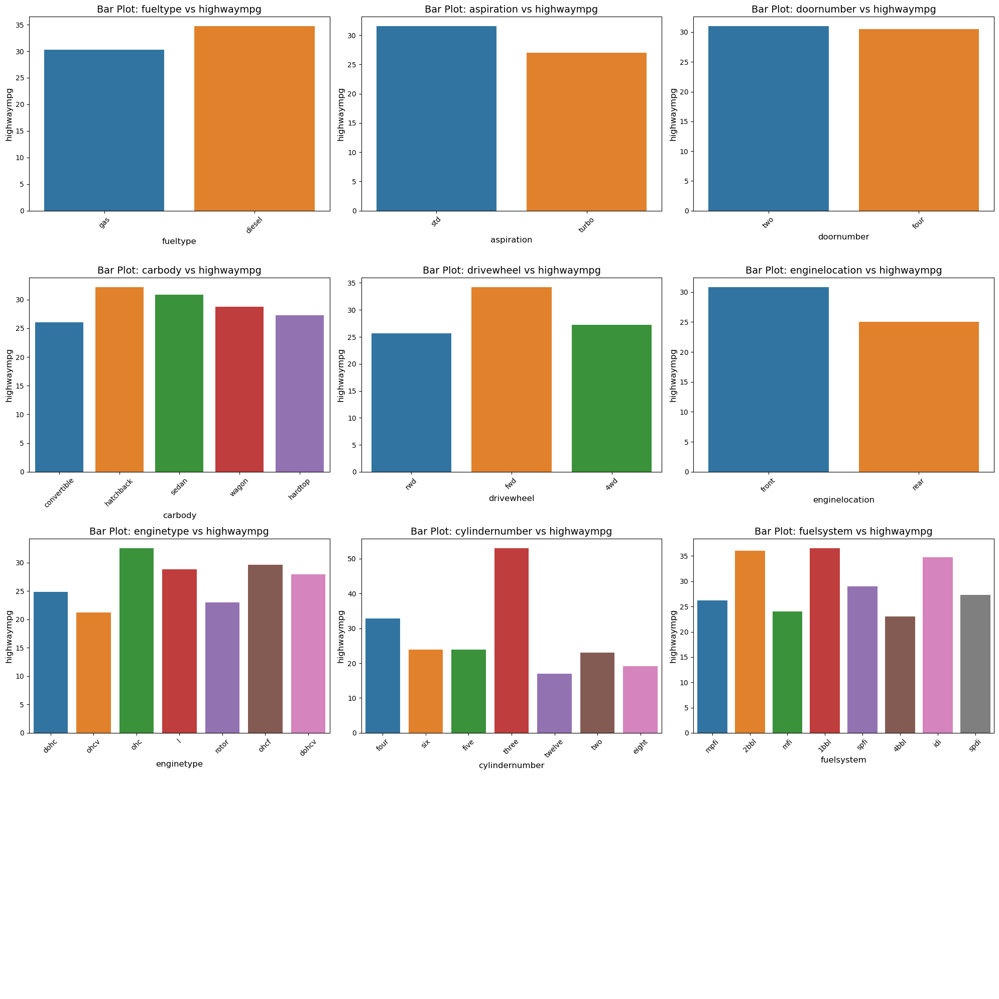

In [42]:
# Select categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns

# Select categorical columns excluding 'CarBrand'
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns = categorical_columns.drop('CarBrand')

# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each bar plot
for i, column in enumerate(categorical_columns):
    sns.barplot(data=df, x=column, y='highwaympg', ax=axes[i], errorbar=None)  # ci=None removes confidence intervals
    axes[i].set_title(f'Bar Plot: {column} vs highwaympg', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('highwaympg', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

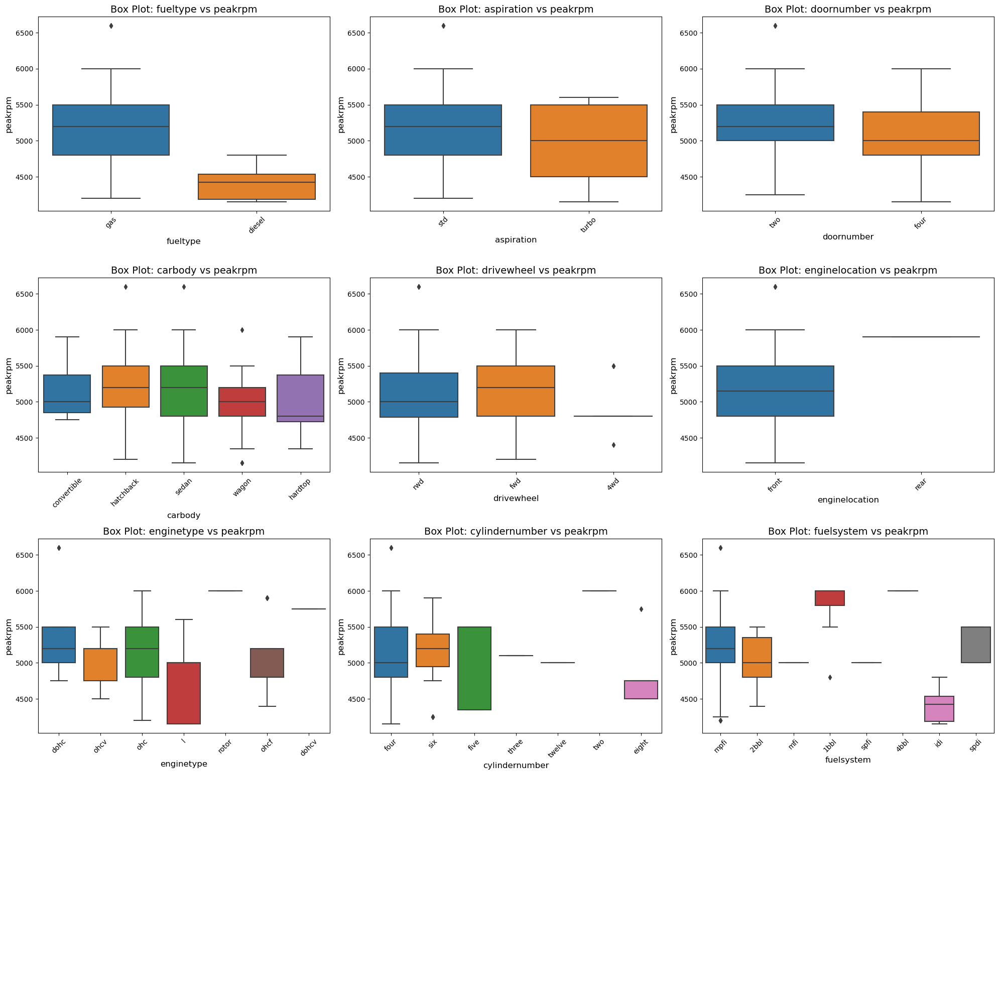

In [43]:
# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each box plot
for i, column in enumerate(categorical_columns):
    sns.boxplot(data=df, x=column, y='peakrpm', ax=axes[i])
    axes[i].set_title(f'Box Plot: {column} vs peakrpm', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('peakrpm', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

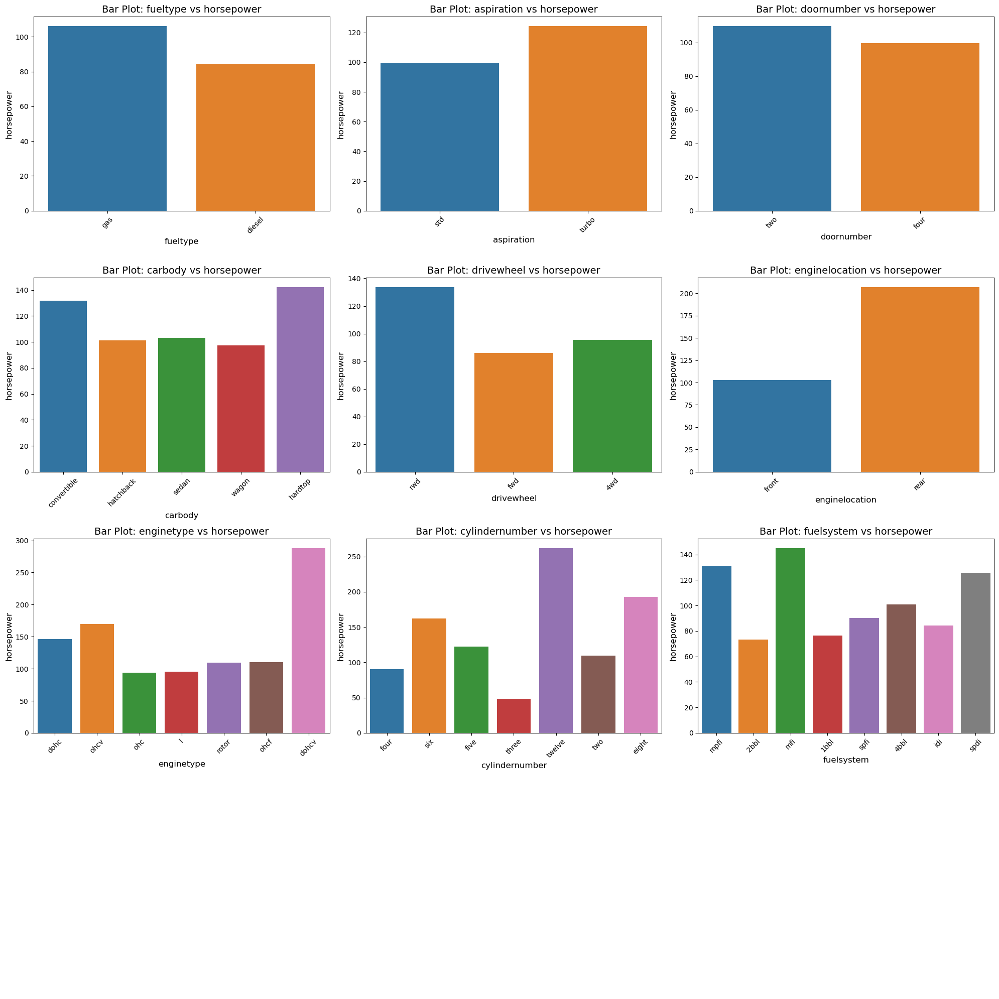

In [44]:
# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each bar plot
for i, column in enumerate(categorical_columns):
    sns.barplot(data=df, x=column, y='horsepower', ax=axes[i], errorbar=None)  # ci=None removes confidence intervals
    axes[i].set_title(f'Bar Plot: {column} vs horsepower', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('horsepower', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

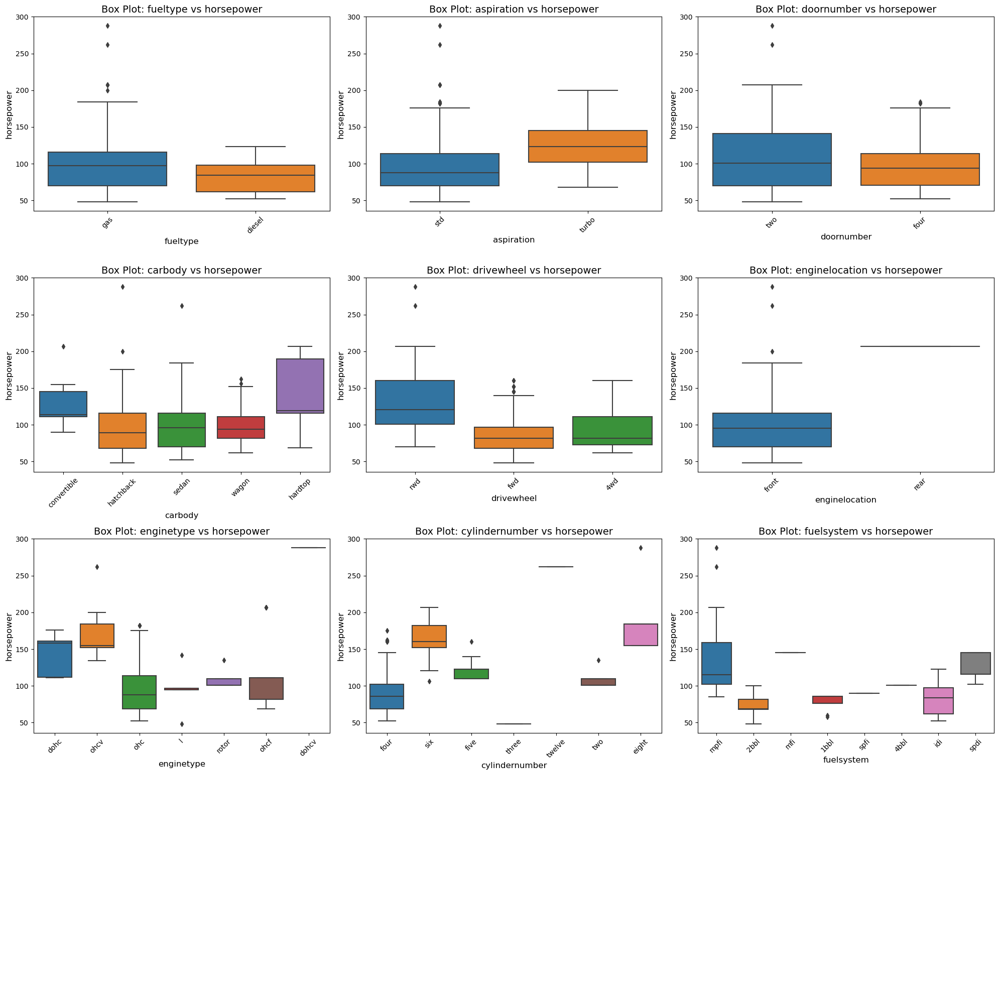

In [45]:
# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each box plot
for i, column in enumerate(categorical_columns):
    sns.boxplot(data=df, x=column, y='horsepower', ax=axes[i])
    axes[i].set_title(f'Box Plot: {column} vs horsepower', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('horsepower', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

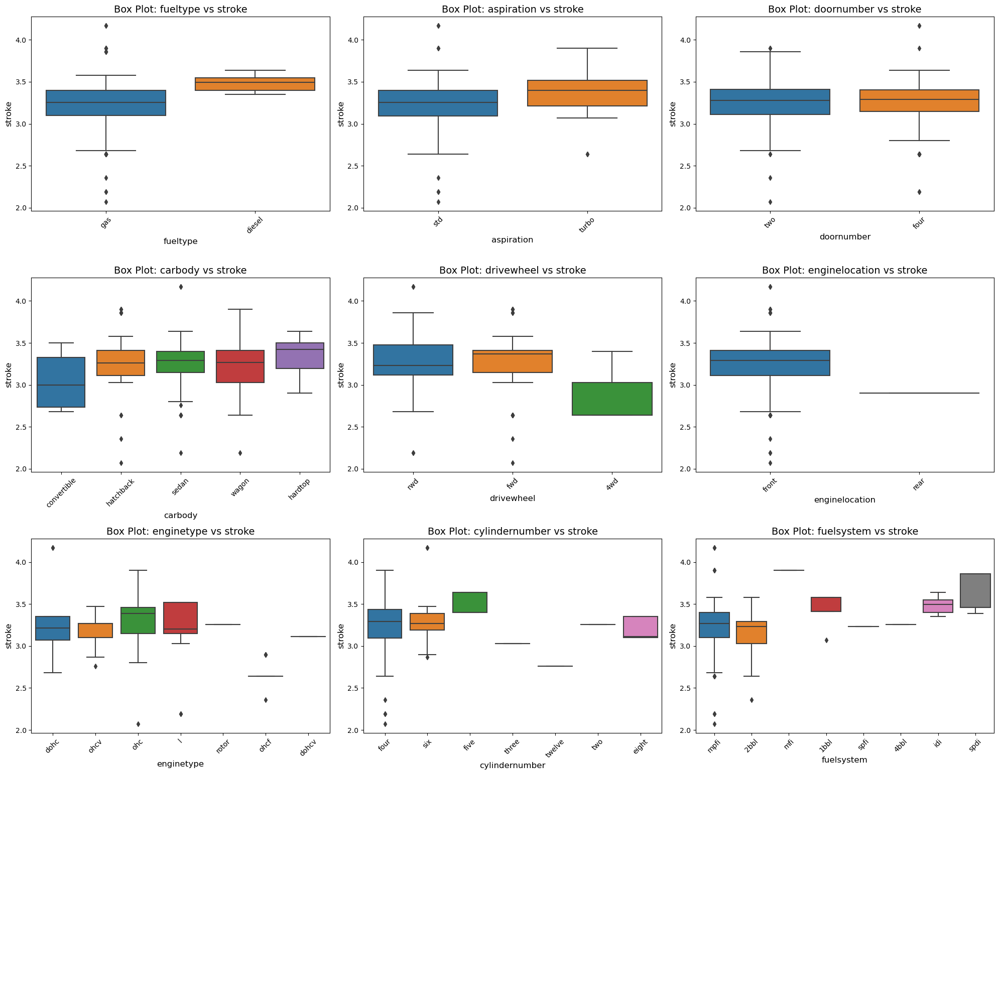

In [46]:
# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each box plot
for i, column in enumerate(categorical_columns):
    sns.boxplot(data=df, x=column, y='stroke', ax=axes[i])
    axes[i].set_title(f'Box Plot: {column} vs stroke', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('stroke', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

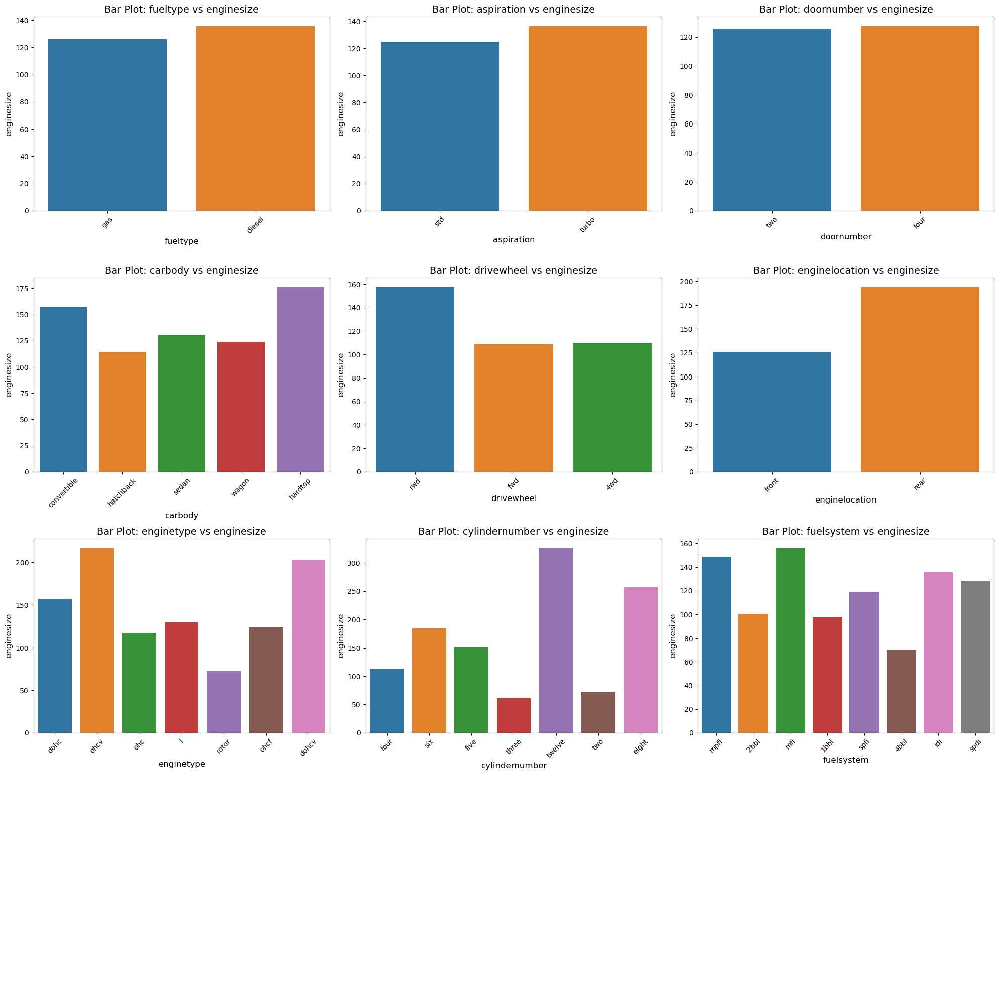

In [47]:
# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each bar plot
for i, column in enumerate(categorical_columns):
    sns.barplot(data=df, x=column, y='enginesize', ax=axes[i], errorbar=None)  # ci=None removes confidence intervals
    axes[i].set_title(f'Bar Plot: {column} vs enginesize', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('enginesize', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

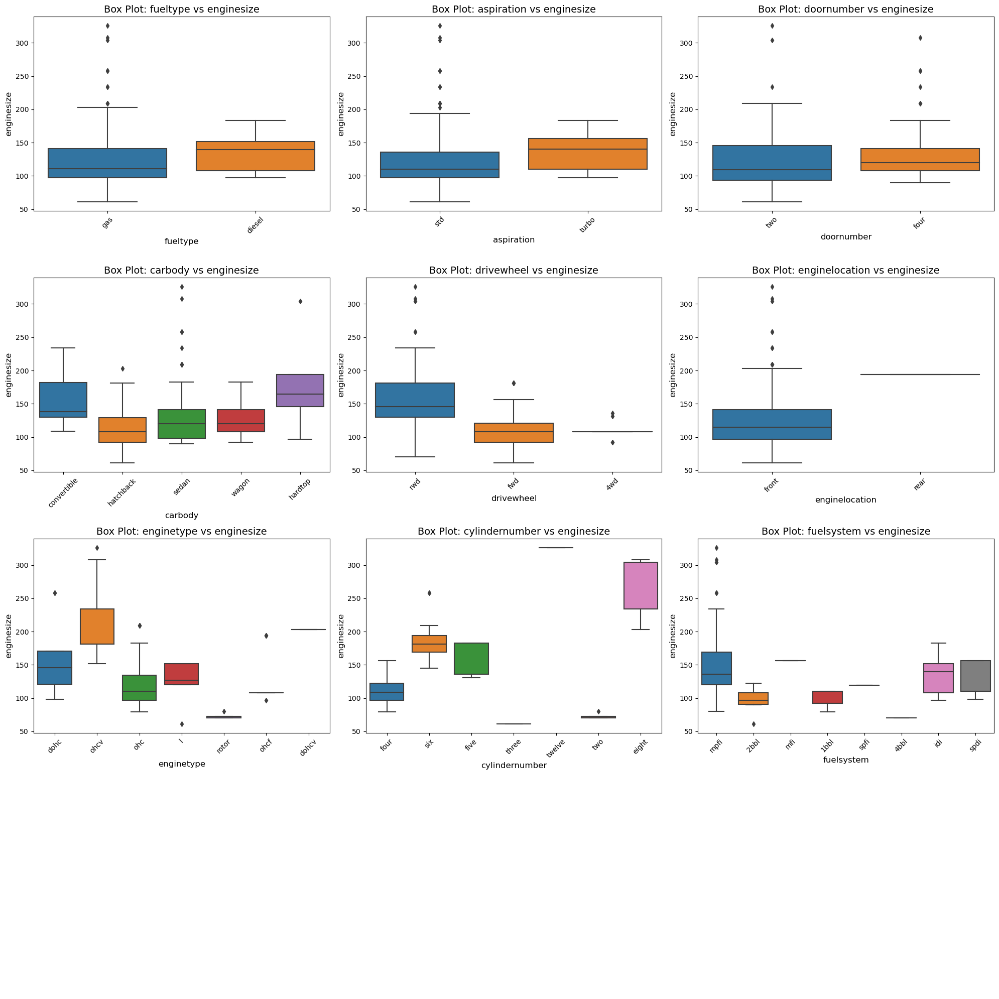

In [48]:
# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each box plot
for i, column in enumerate(categorical_columns):
    sns.boxplot(data=df, x=column, y='enginesize', ax=axes[i])
    axes[i].set_title(f'Box Plot: {column} vs enginesize', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('enginesize', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

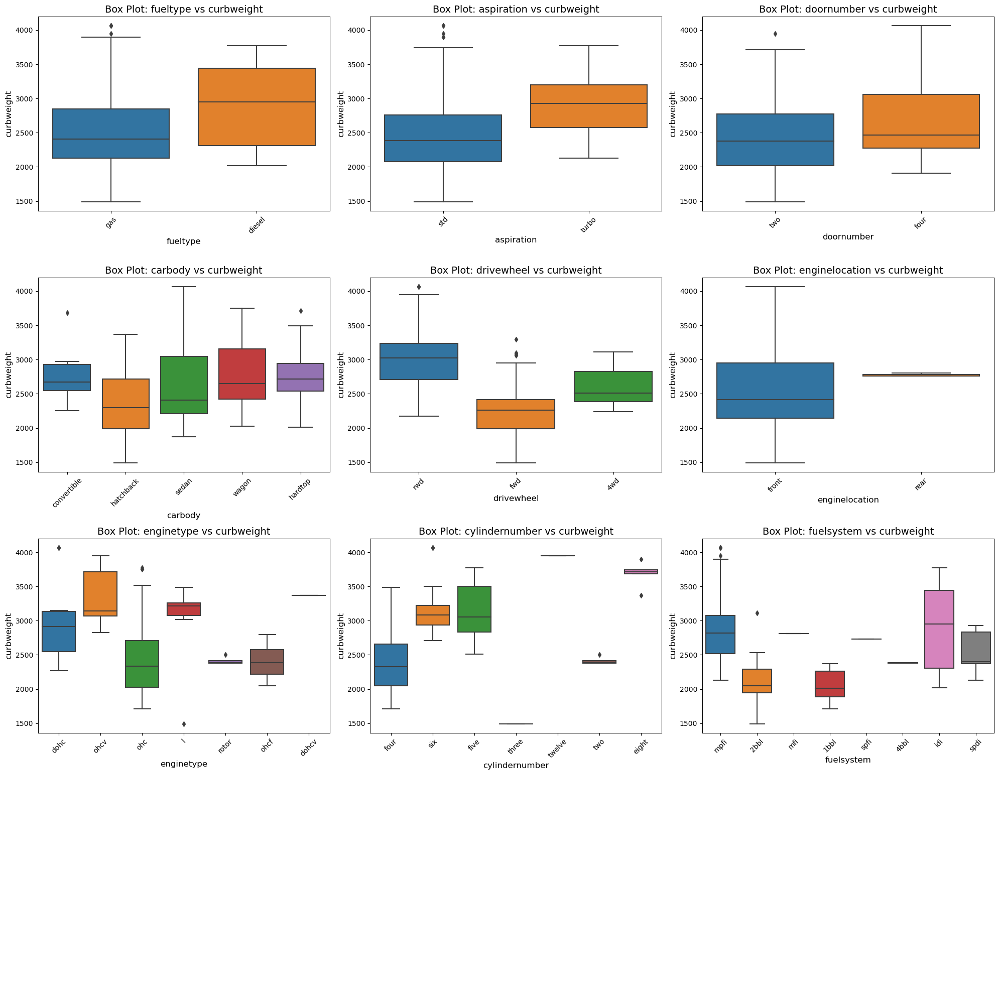

In [49]:
# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each box plot
for i, column in enumerate(categorical_columns):
    sns.boxplot(data=df, x=column, y='curbweight', ax=axes[i])
    axes[i].set_title(f'Box Plot: {column} vs curbweight', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('curbweight', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

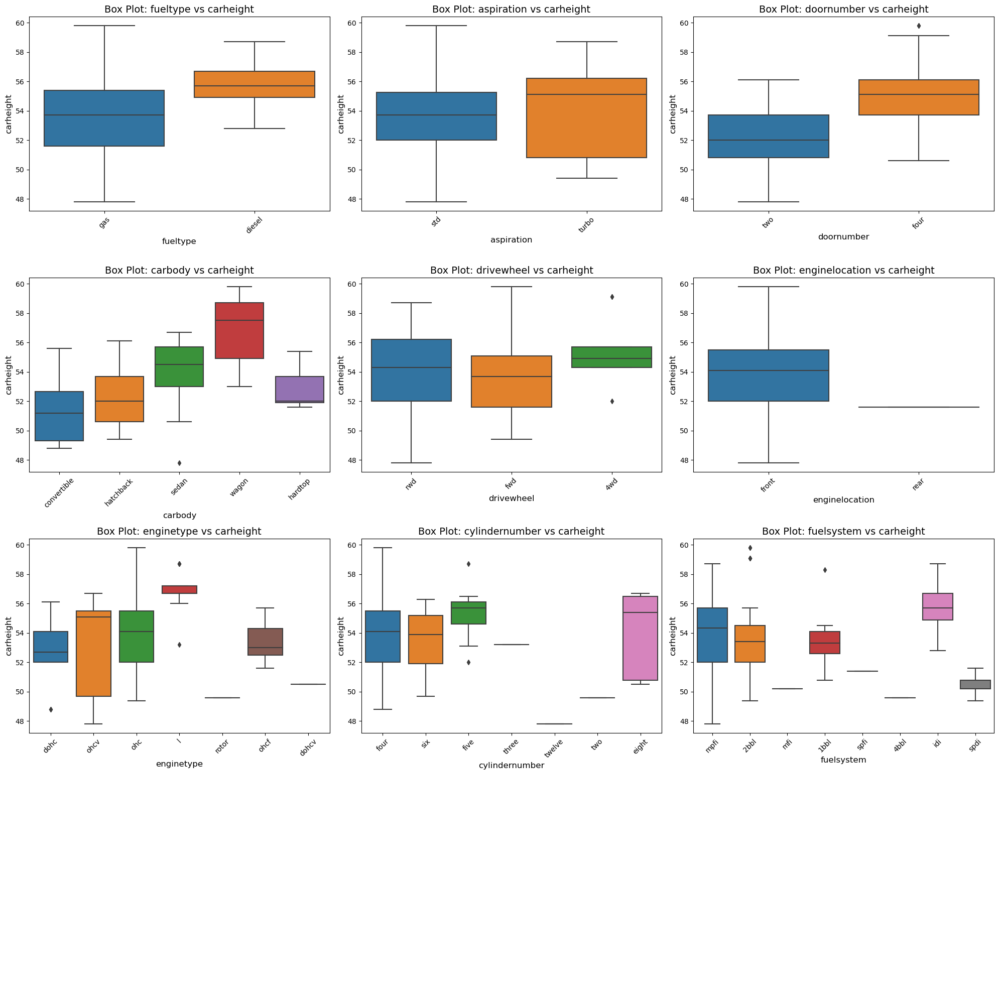

In [50]:
# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each box plot
for i, column in enumerate(categorical_columns):
    sns.boxplot(data=df, x=column, y='carheight', ax=axes[i])
    axes[i].set_title(f'Box Plot: {column} vs carheight', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('carheight', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

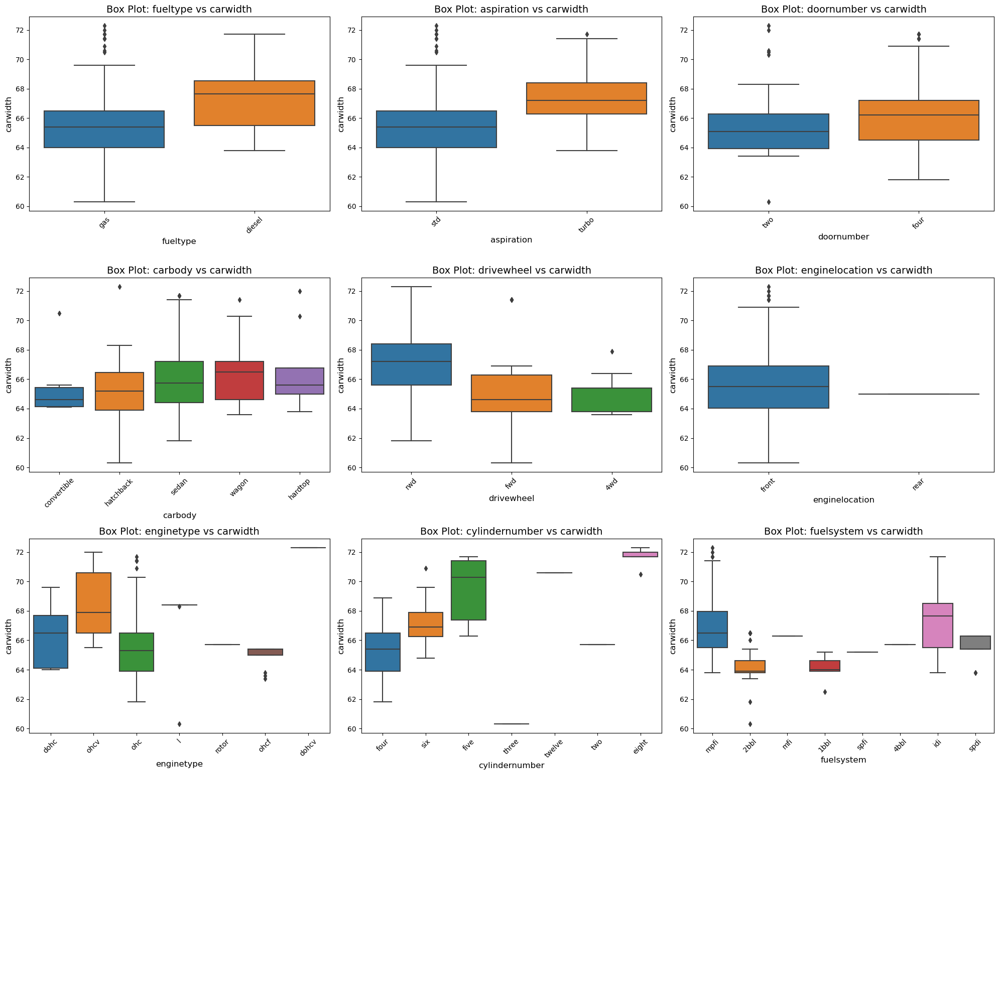

In [51]:
# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each box plot
for i, column in enumerate(categorical_columns):
    sns.boxplot(data=df, x=column, y='carwidth', ax=axes[i])
    axes[i].set_title(f'Box Plot: {column} vs carwidth', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('carwidth', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

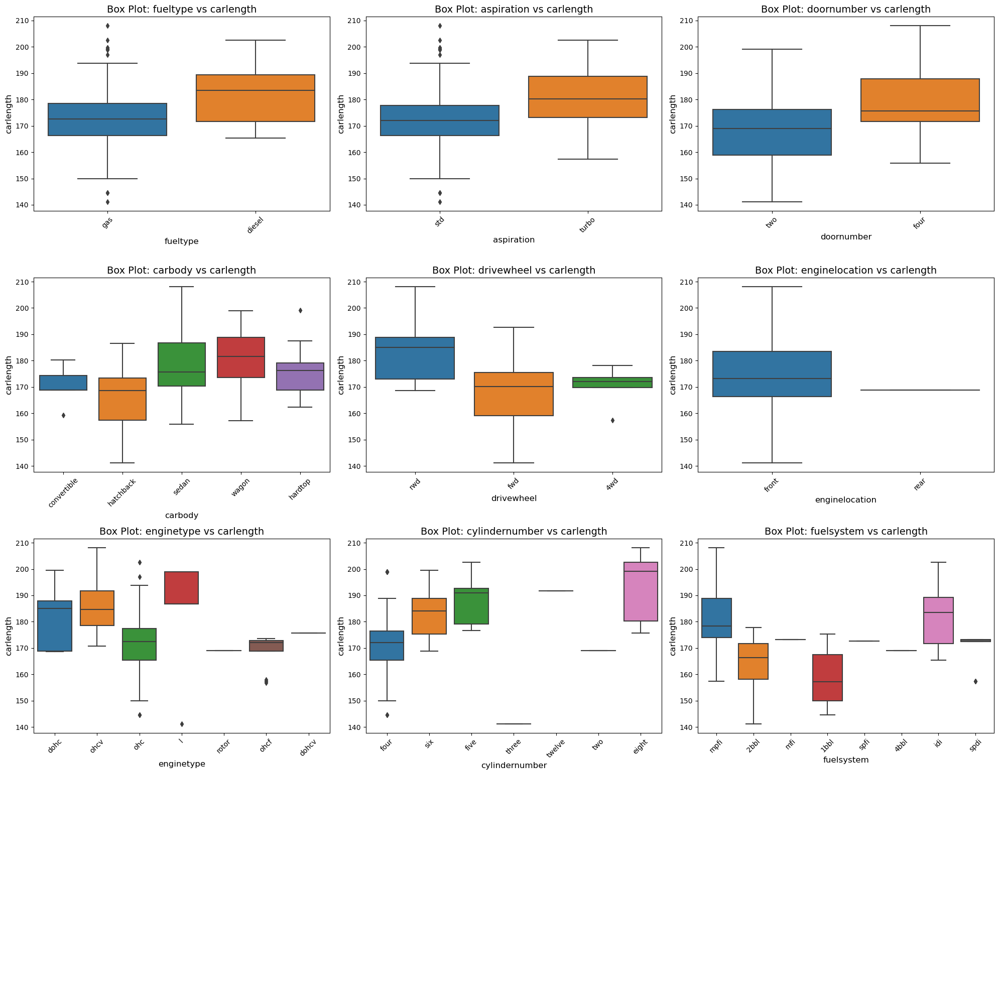

In [52]:
# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each box plot
for i, column in enumerate(categorical_columns):
    sns.boxplot(data=df, x=column, y='carlength', ax=axes[i])
    axes[i].set_title(f'Box Plot: {column} vs carlength', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('carlength', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

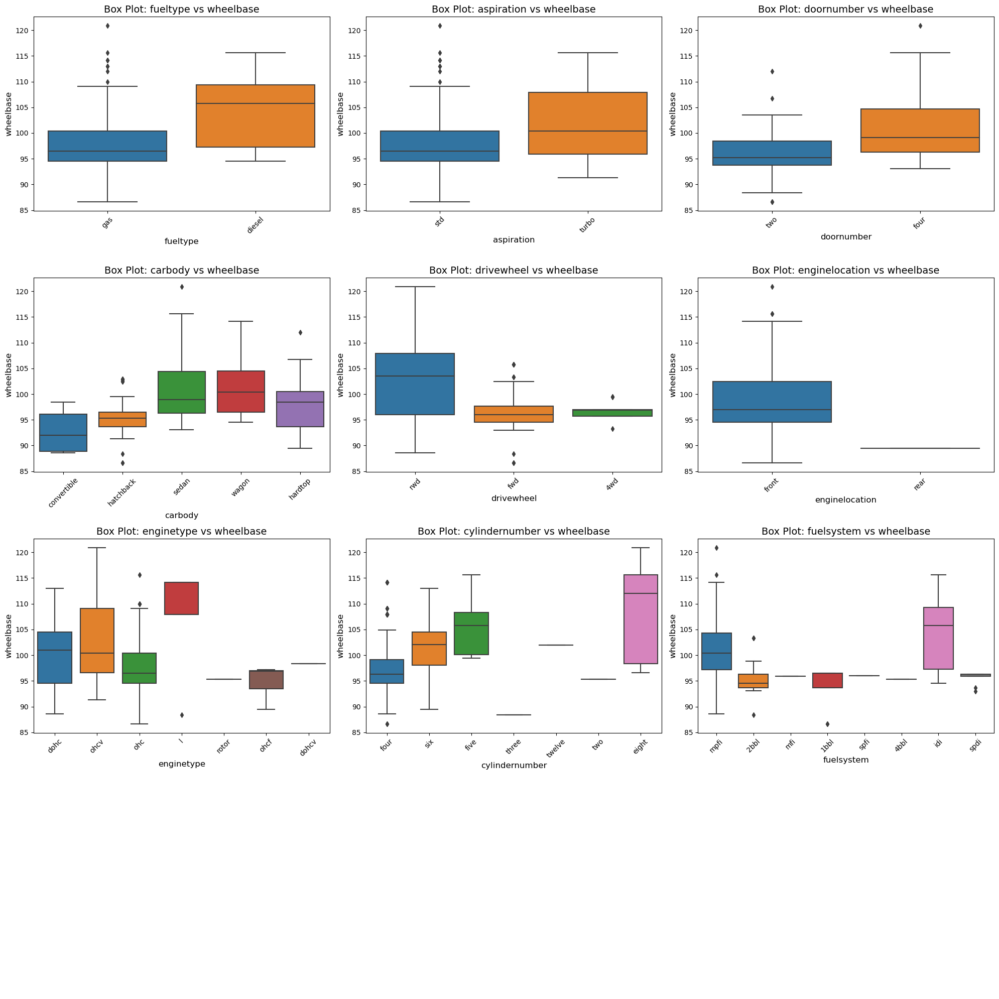

In [53]:
# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each box plot
for i, column in enumerate(categorical_columns):
    sns.boxplot(data=df, x=column, y='wheelbase', ax=axes[i])
    axes[i].set_title(f'Box Plot: {column} vs wheelbase', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('wheelbase', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

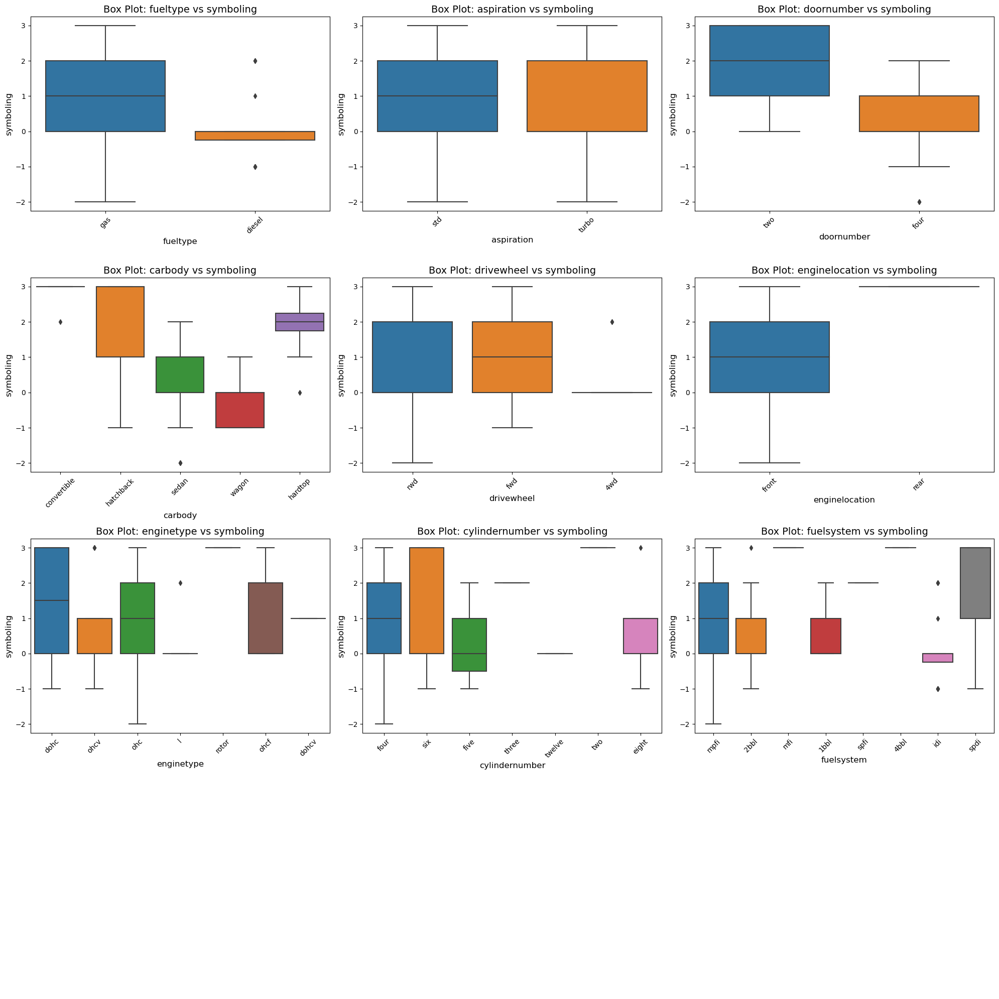

In [54]:
# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each box plot
for i, column in enumerate(categorical_columns):
    sns.boxplot(data=df, x=column, y='symboling', ax=axes[i])
    axes[i].set_title(f'Box Plot: {column} vs symboling', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('symboling', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

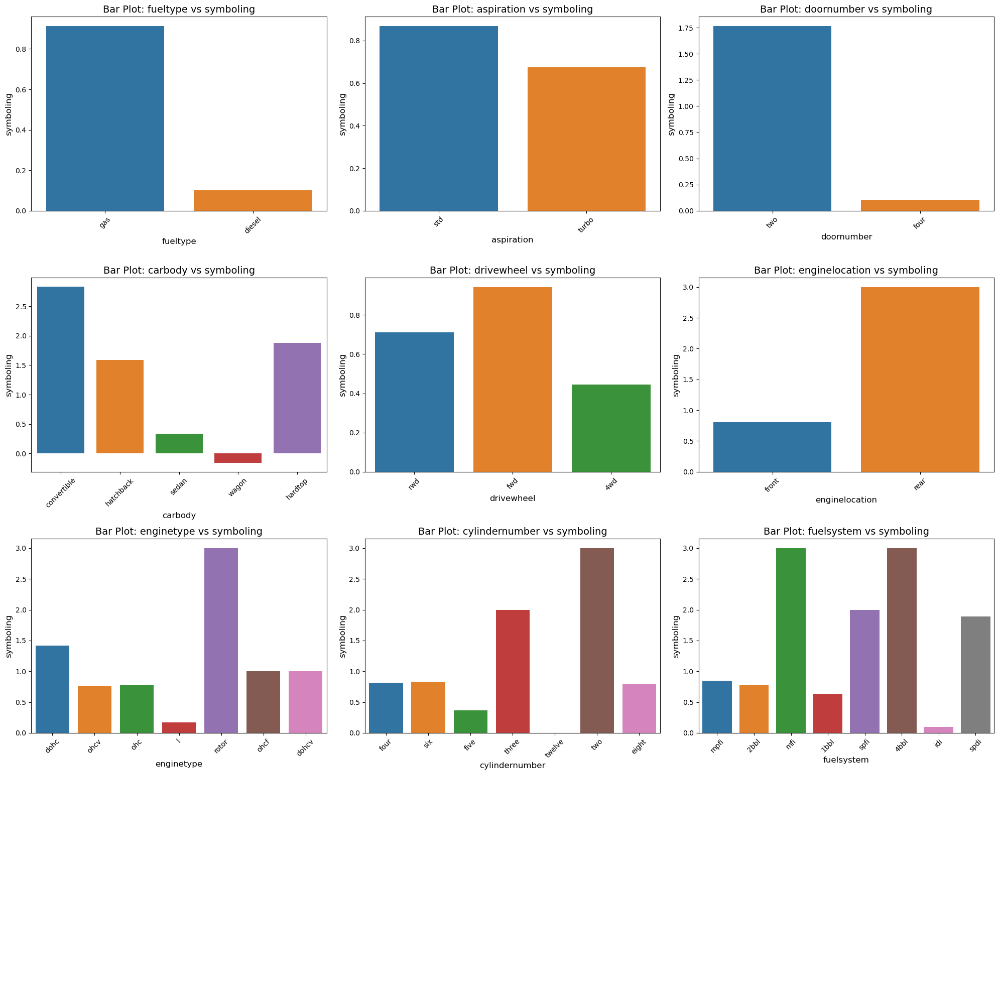

In [55]:
# Create subplots for all categorical columns
num_columns = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_columns // 3) + 1, ncols=3, figsize=(20, 5 * ((num_columns // 3) + 1)))

# Flatten axes for easy indexing
axes = axes.flatten()

# Plot each bar plot
for i, column in enumerate(categorical_columns):
    sns.barplot(data=df, x=column, y='symboling', ax=axes[i], errorbar=None)  # ci=None removes confidence intervals
    axes[i].set_title(f'Bar Plot: {column} vs symboling', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('symboling', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

# Bar plots for categorial vs categorial data

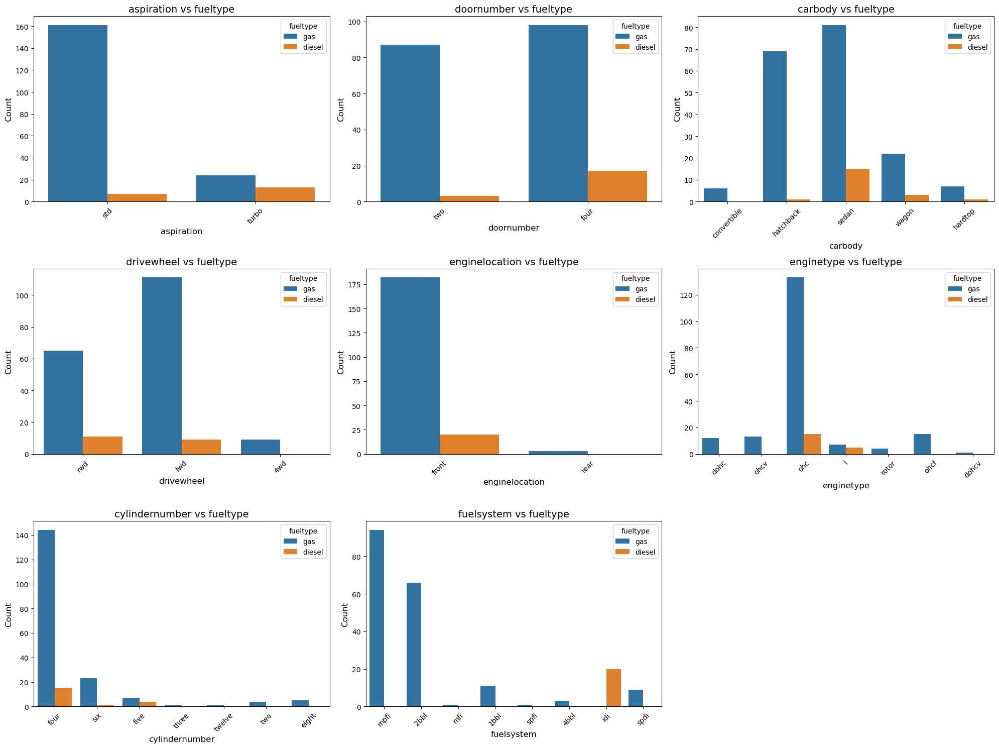

In [56]:
# Select categorical columns excluding 'CarBrand' and 'fueltype'
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns = categorical_columns.drop(['CarBrand', 'fueltype'])

# Determine the number of plots
num_columns = len(categorical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot bar plots
for i, column in enumerate(categorical_columns):
    sns.countplot(data=df, x=column, hue='fueltype', ax=axes[i])
    axes[i].set_title(f'{column} vs fueltype', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('Count', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

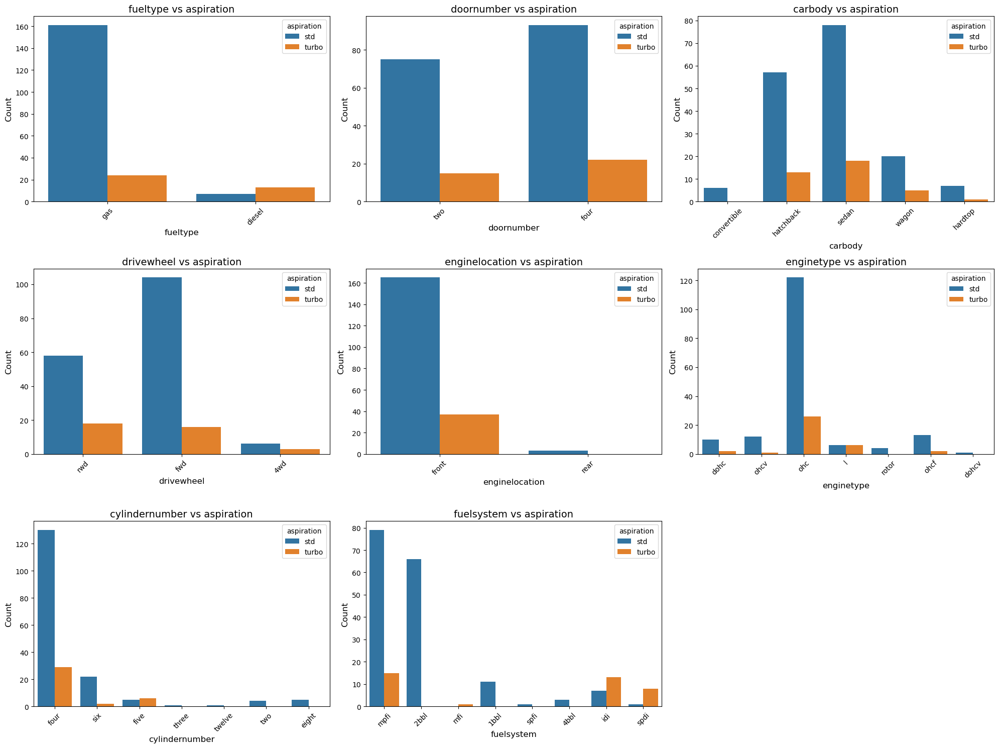

In [57]:
# Select categorical columns excluding 'CarBrand' and 'fueltype'
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns = categorical_columns.drop(['CarBrand', 'aspiration'])

# Determine the number of plots
num_columns = len(categorical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot bar plots
for i, column in enumerate(categorical_columns):
    sns.countplot(data=df, x=column, hue='aspiration', ax=axes[i])
    axes[i].set_title(f'{column} vs aspiration', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('Count', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

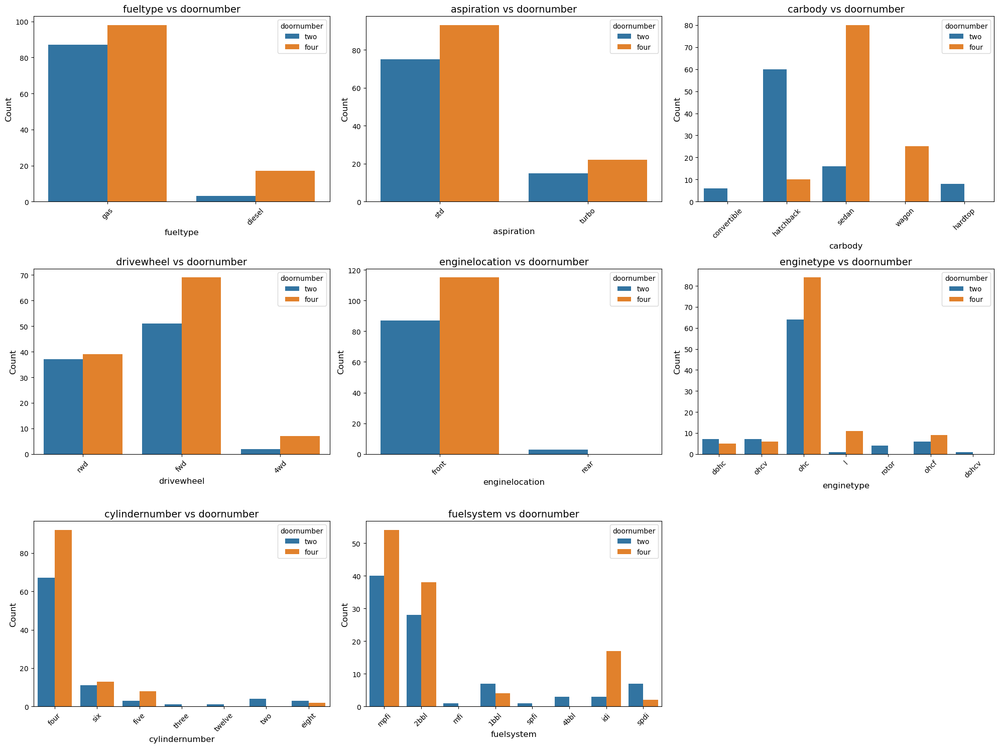

In [58]:
# Select categorical columns excluding 'CarBrand' and 'fueltype'
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns = categorical_columns.drop(['CarBrand', 'doornumber'])

# Determine the number of plots
num_columns = len(categorical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot bar plots
for i, column in enumerate(categorical_columns):
    sns.countplot(data=df, x=column, hue='doornumber', ax=axes[i])
    axes[i].set_title(f'{column} vs doornumber', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('Count', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

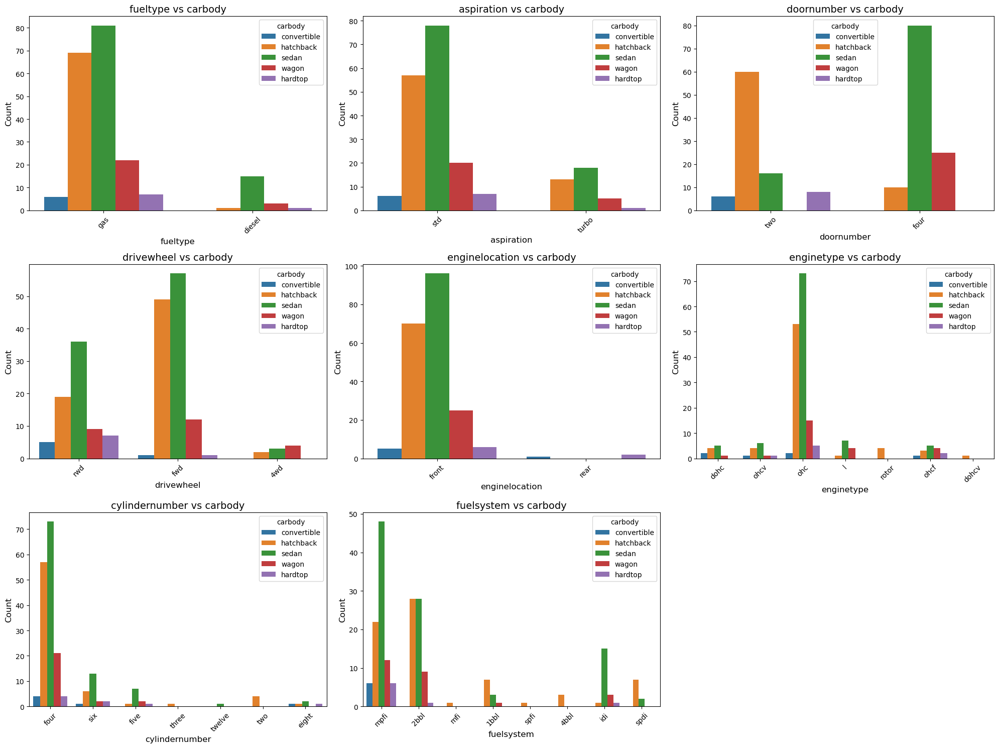

In [59]:
# Select categorical columns excluding 'CarBrand' and 'fueltype'
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns = categorical_columns.drop(['CarBrand', 'carbody'])

# Determine the number of plots
num_columns = len(categorical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot bar plots
for i, column in enumerate(categorical_columns):
    sns.countplot(data=df, x=column, hue='carbody', ax=axes[i])
    axes[i].set_title(f'{column} vs carbody', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('Count', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

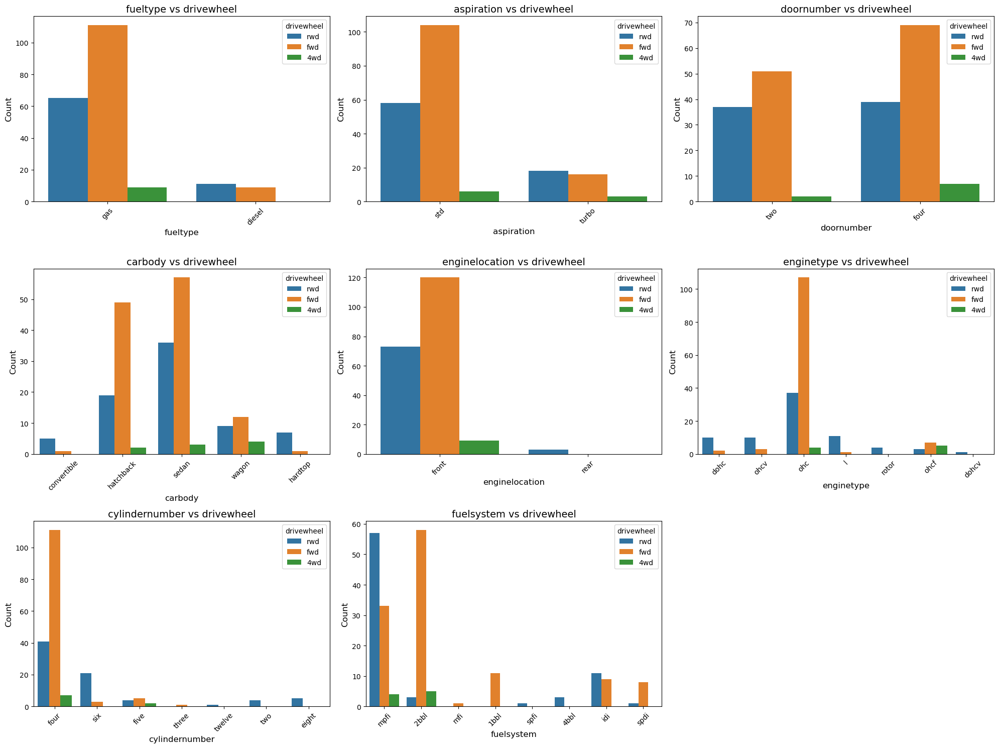

In [60]:
# Select categorical columns excluding 'CarBrand' and 'fueltype'
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns = categorical_columns.drop(['CarBrand', 'drivewheel'])

# Determine the number of plots
num_columns = len(categorical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot bar plots
for i, column in enumerate(categorical_columns):
    sns.countplot(data=df, x=column, hue='drivewheel', ax=axes[i])
    axes[i].set_title(f'{column} vs drivewheel', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('Count', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

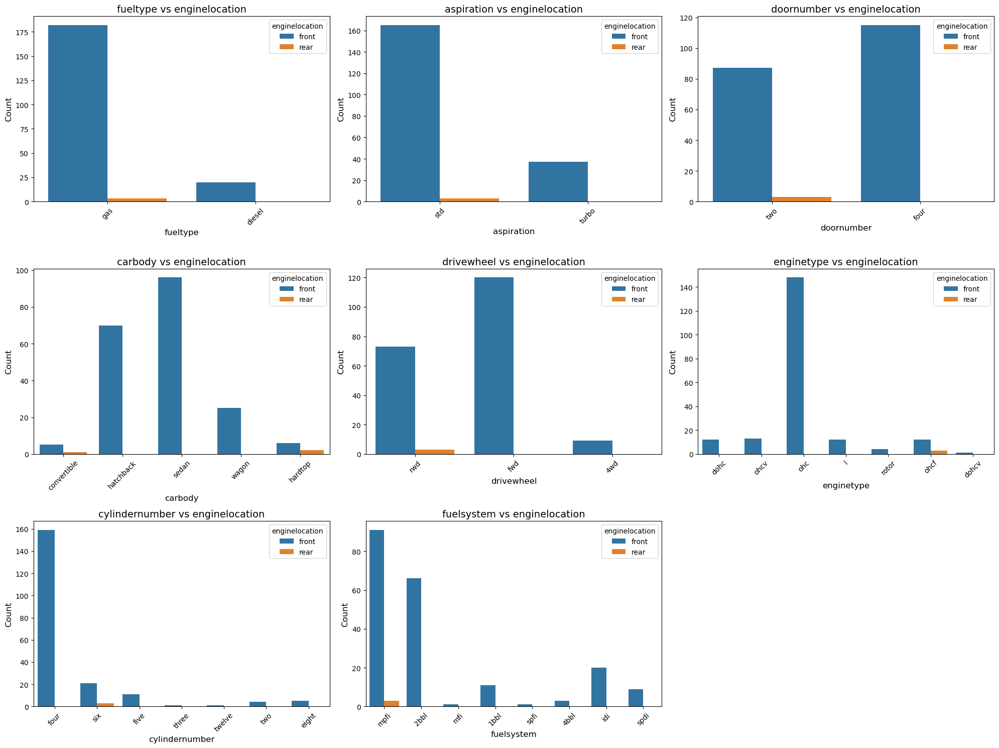

In [61]:
# Select categorical columns excluding 'CarBrand' and 'fueltype'
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns = categorical_columns.drop(['CarBrand', 'enginelocation'])

# Determine the number of plots
num_columns = len(categorical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot bar plots
for i, column in enumerate(categorical_columns):
    sns.countplot(data=df, x=column, hue='enginelocation', ax=axes[i])
    axes[i].set_title(f'{column} vs enginelocation', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('Count', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

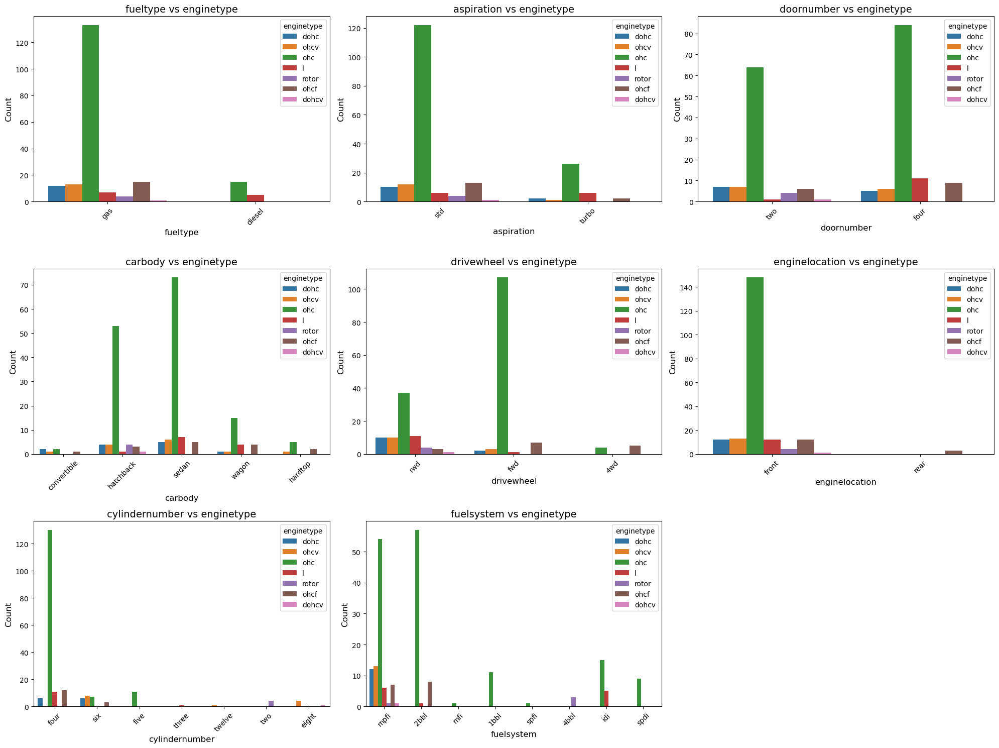

In [62]:
# Select categorical columns excluding 'CarBrand' and 'fueltype'
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns = categorical_columns.drop(['CarBrand', 'enginetype'])

# Determine the number of plots
num_columns = len(categorical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot bar plots
for i, column in enumerate(categorical_columns):
    sns.countplot(data=df, x=column, hue='enginetype', ax=axes[i])
    axes[i].set_title(f'{column} vs enginetype', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('Count', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

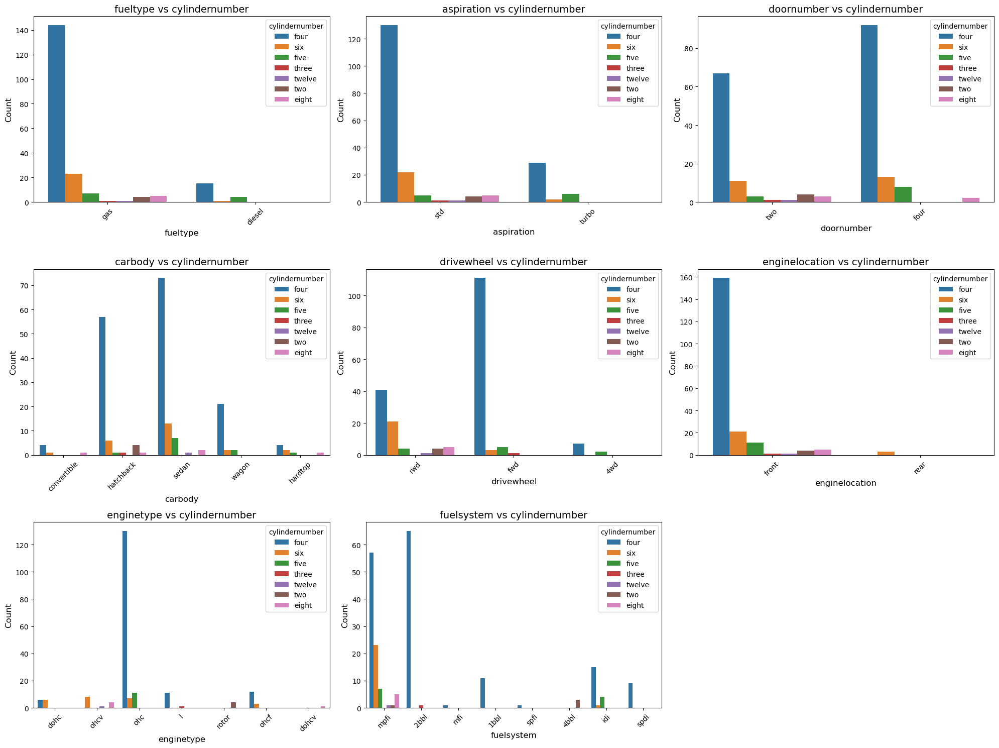

In [63]:
# Select categorical columns excluding 'CarBrand' and 'fueltype'
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns = categorical_columns.drop(['CarBrand', 'cylindernumber'])

# Determine the number of plots
num_columns = len(categorical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot bar plots
for i, column in enumerate(categorical_columns):
    sns.countplot(data=df, x=column, hue='cylindernumber', ax=axes[i])
    axes[i].set_title(f'{column} vs cylindernumber', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('Count', fontsize=12)
    axes[i].tick_params(axis='x', rotation=45)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# Scatter plots for numerical vs numerical data

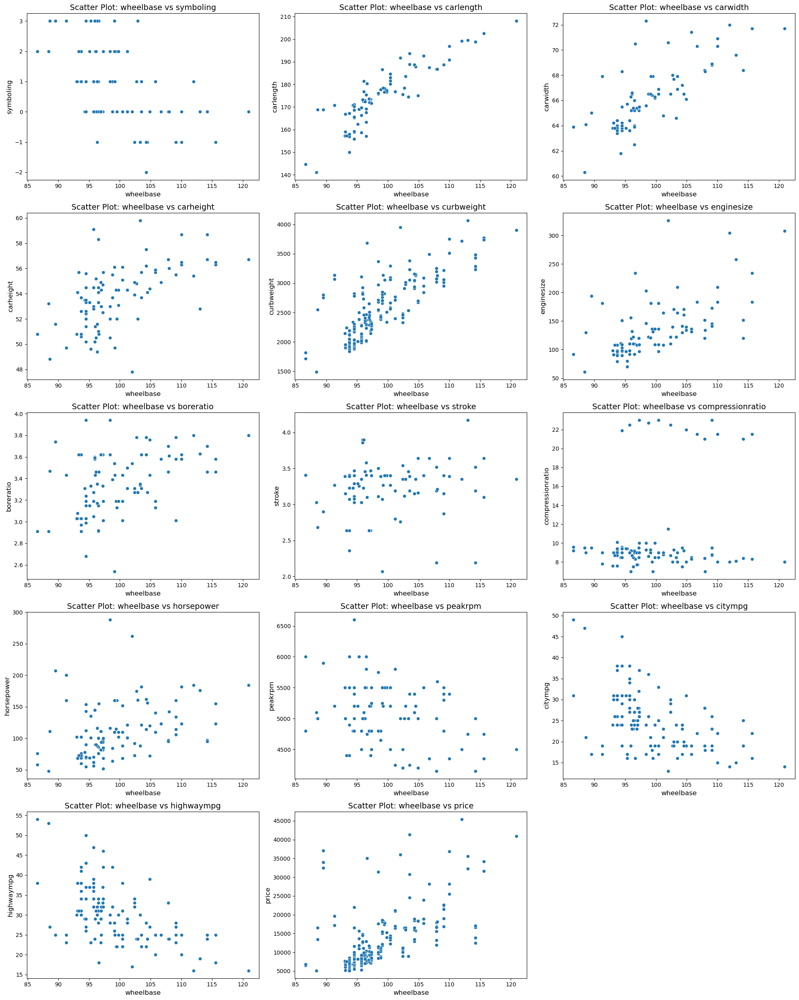

In [64]:
# Select numerical columns excluding 'car_ID', 'price', and 'wheelbase'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop(['car_ID', 'wheelbase'])

# Determine the number of plots
num_columns = len(numerical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot scatter plots
for i, column in enumerate(numerical_columns):
    sns.scatterplot(data=df, x='wheelbase', y=column, ax=axes[i])
    axes[i].set_title(f'Scatter Plot: wheelbase vs {column}', fontsize=14)
    axes[i].set_xlabel('wheelbase', fontsize=12)
    axes[i].set_ylabel(column, fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

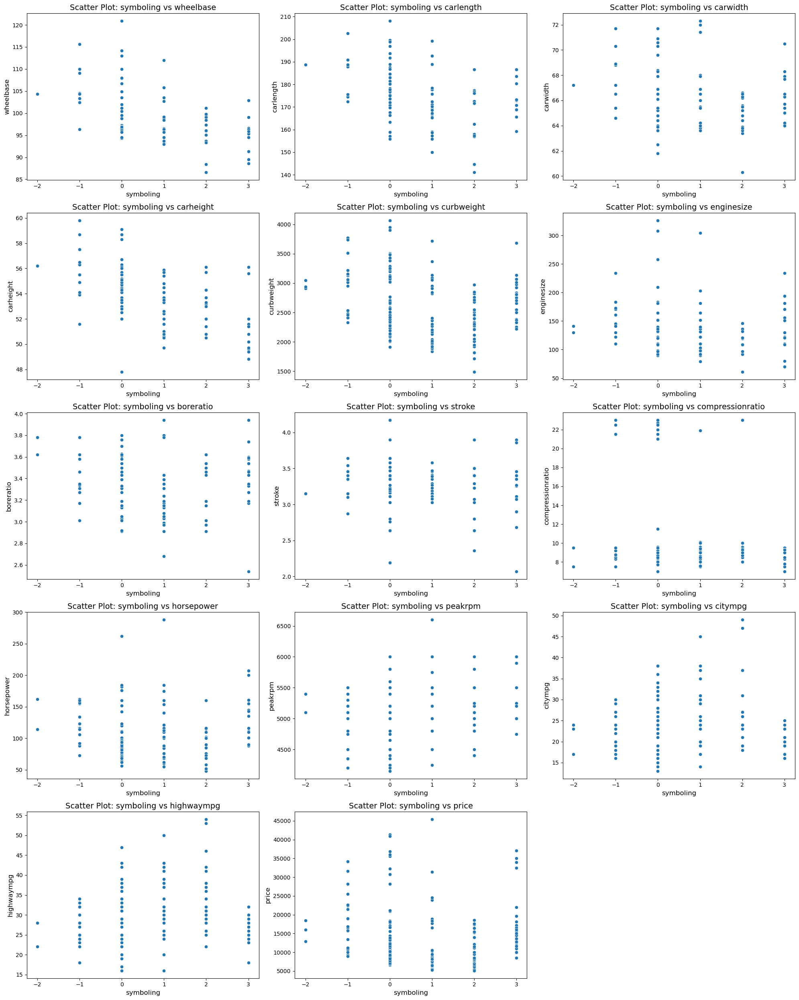

In [65]:
# Select numerical columns excluding 'car_ID', 'price', and 'wheelbase'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop(['car_ID', 'symboling'])

# Determine the number of plots
num_columns = len(numerical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot scatter plots
for i, column in enumerate(numerical_columns):
    sns.scatterplot(data=df, x='symboling', y=column, ax=axes[i])
    axes[i].set_title(f'Scatter Plot: symboling vs {column}', fontsize=14)
    axes[i].set_xlabel('symboling', fontsize=12)
    axes[i].set_ylabel(column, fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

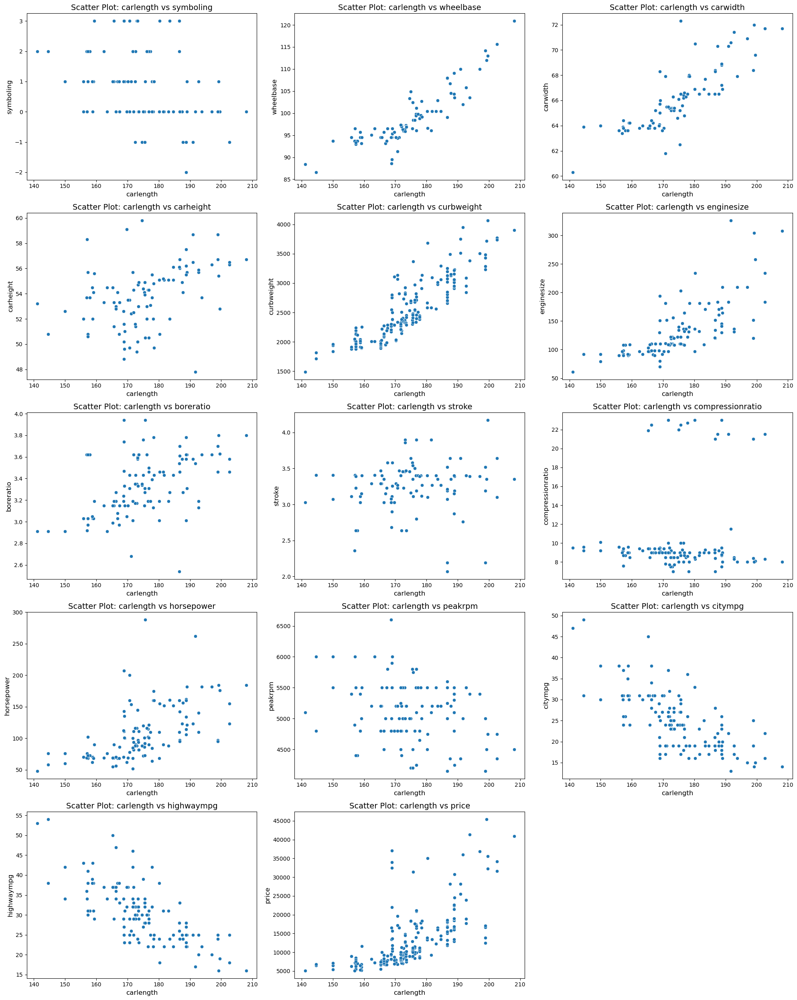

In [66]:
# Select numerical columns excluding 'car_ID', 'price', and 'wheelbase'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop(['car_ID', 'carlength'])

# Determine the number of plots
num_columns = len(numerical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot scatter plots
for i, column in enumerate(numerical_columns):
    sns.scatterplot(data=df, x='carlength', y=column, ax=axes[i])
    axes[i].set_title(f'Scatter Plot: carlength vs {column}', fontsize=14)
    axes[i].set_xlabel('carlength', fontsize=12)
    axes[i].set_ylabel(column, fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

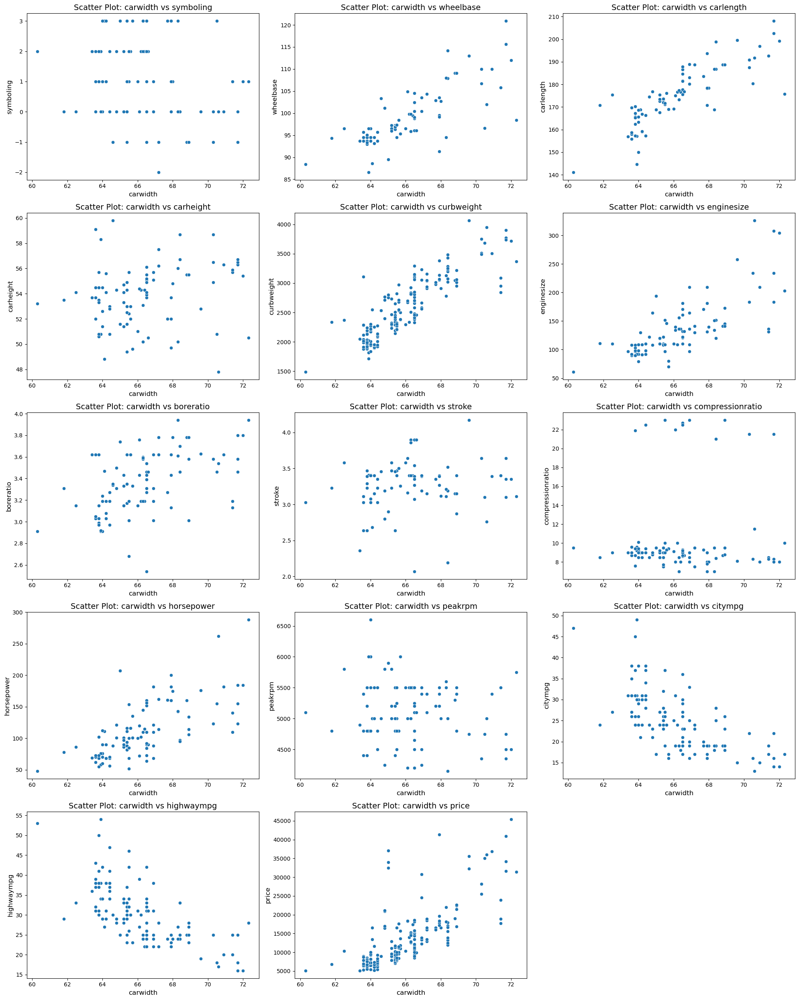

In [67]:
# Select numerical columns excluding 'car_ID', 'price', and 'wheelbase'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop(['car_ID', 'carwidth'])

# Determine the number of plots
num_columns = len(numerical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot scatter plots
for i, column in enumerate(numerical_columns):
    sns.scatterplot(data=df, x='carwidth', y=column, ax=axes[i])
    axes[i].set_title(f'Scatter Plot: carwidth vs {column}', fontsize=14)
    axes[i].set_xlabel('carwidth', fontsize=12)
    axes[i].set_ylabel(column, fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

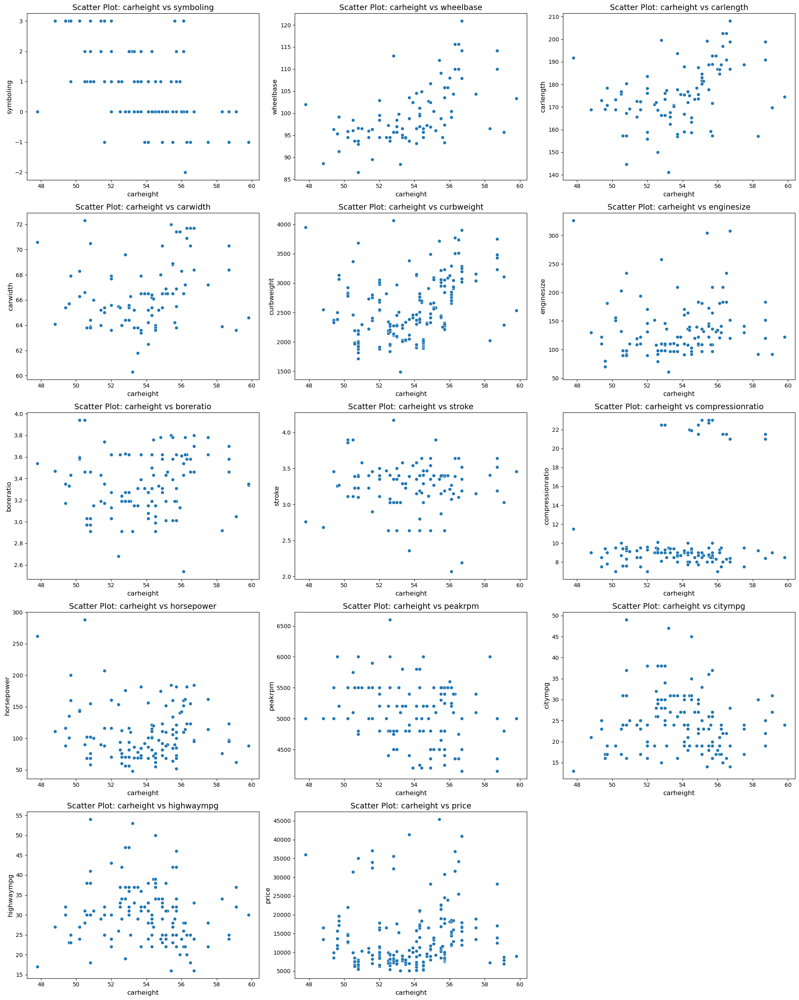

In [68]:
# Select numerical columns excluding 'car_ID', 'price', and 'wheelbase'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop(['car_ID', 'carheight'])

# Determine the number of plots
num_columns = len(numerical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot scatter plots
for i, column in enumerate(numerical_columns):
    sns.scatterplot(data=df, x='carheight', y=column, ax=axes[i])
    axes[i].set_title(f'Scatter Plot: carheight vs {column}', fontsize=14)
    axes[i].set_xlabel('carheight', fontsize=12)
    axes[i].set_ylabel(column, fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

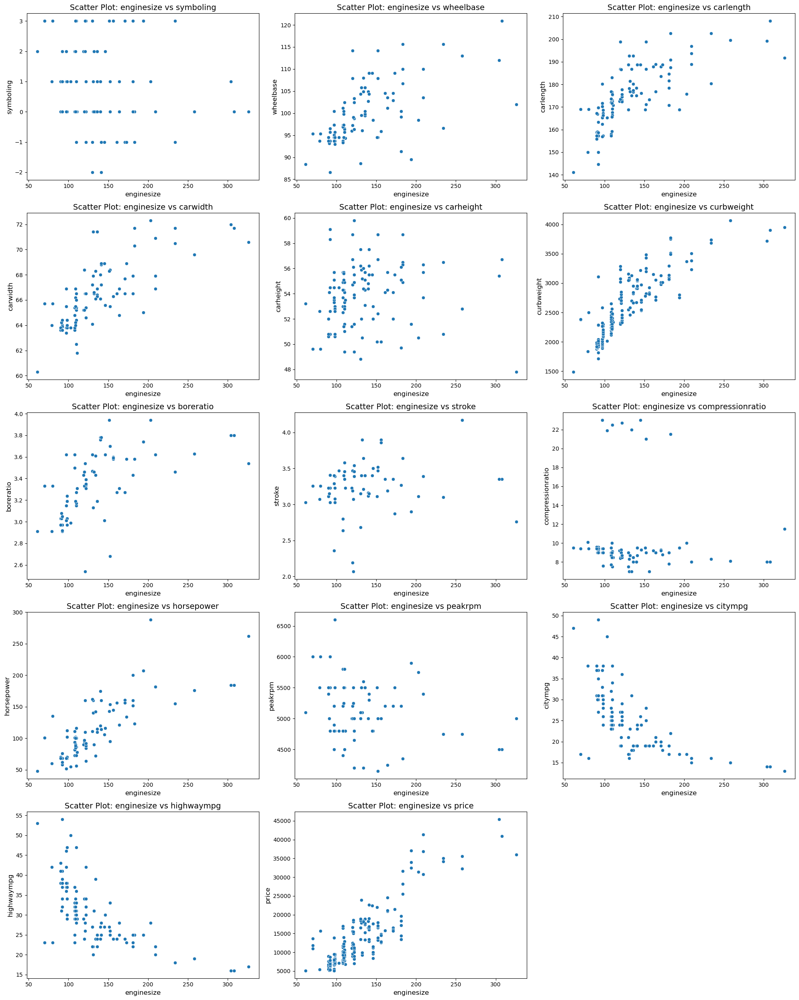

In [69]:
# Select numerical columns excluding 'car_ID', 'price', and 'wheelbase'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop(['car_ID', 'enginesize'])

# Determine the number of plots
num_columns = len(numerical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot scatter plots
for i, column in enumerate(numerical_columns):
    sns.scatterplot(data=df, x='enginesize', y=column, ax=axes[i])
    axes[i].set_title(f'Scatter Plot: enginesize vs {column}', fontsize=14)
    axes[i].set_xlabel('enginesize', fontsize=12)
    axes[i].set_ylabel(column, fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

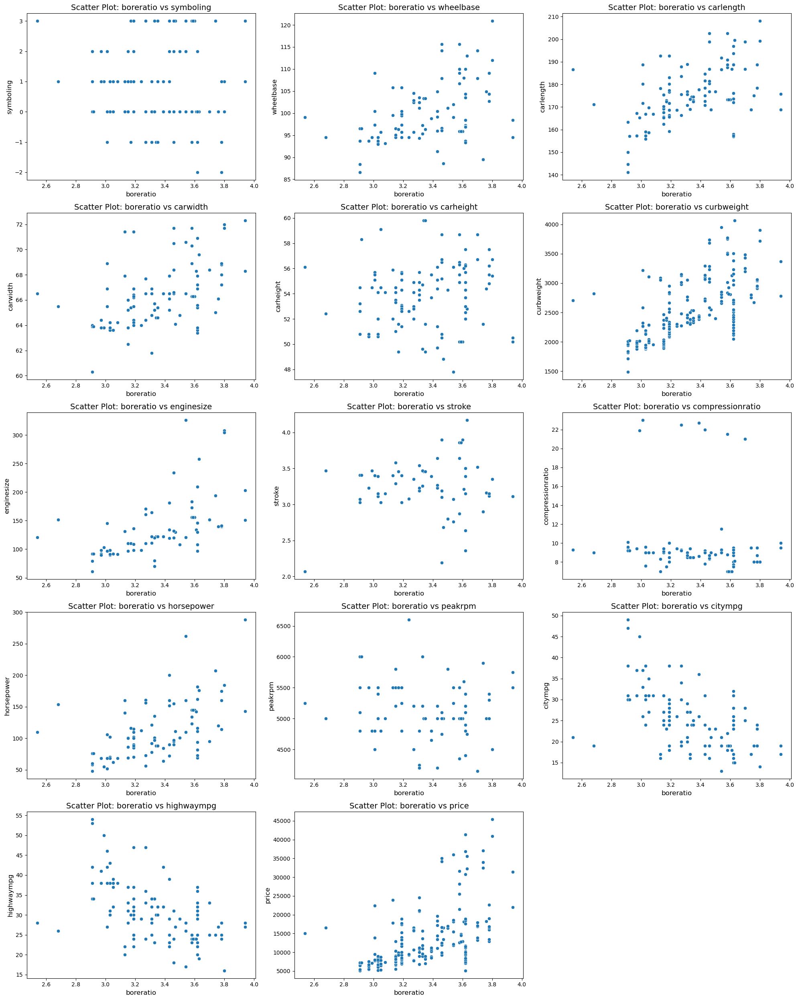

In [70]:
# Select numerical columns excluding 'car_ID', 'price', and 'wheelbase'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop(['car_ID', 'boreratio'])

# Determine the number of plots
num_columns = len(numerical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot scatter plots
for i, column in enumerate(numerical_columns):
    sns.scatterplot(data=df, x='boreratio', y=column, ax=axes[i])
    axes[i].set_title(f'Scatter Plot: boreratio vs {column}', fontsize=14)
    axes[i].set_xlabel('boreratio', fontsize=12)
    axes[i].set_ylabel(column, fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

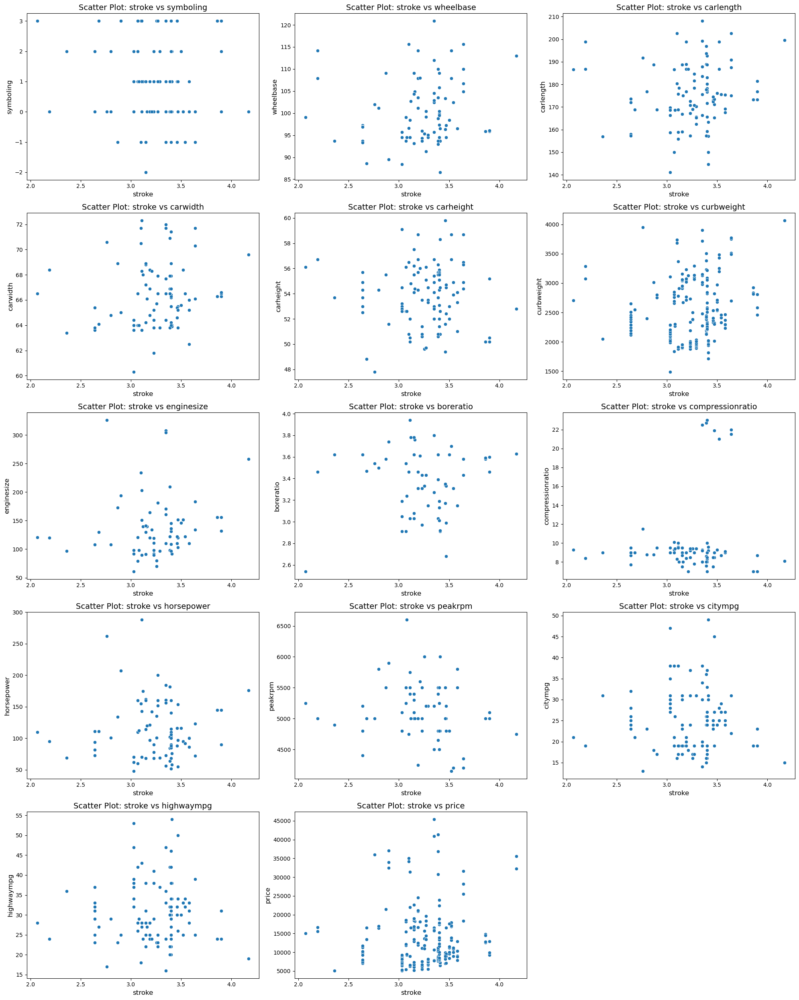

In [71]:
# Select numerical columns excluding 'car_ID', 'price', and 'wheelbase'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop(['car_ID', 'stroke'])

# Determine the number of plots
num_columns = len(numerical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot scatter plots
for i, column in enumerate(numerical_columns):
    sns.scatterplot(data=df, x='stroke', y=column, ax=axes[i])
    axes[i].set_title(f'Scatter Plot: stroke vs {column}', fontsize=14)
    axes[i].set_xlabel('stroke', fontsize=12)
    axes[i].set_ylabel(column, fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

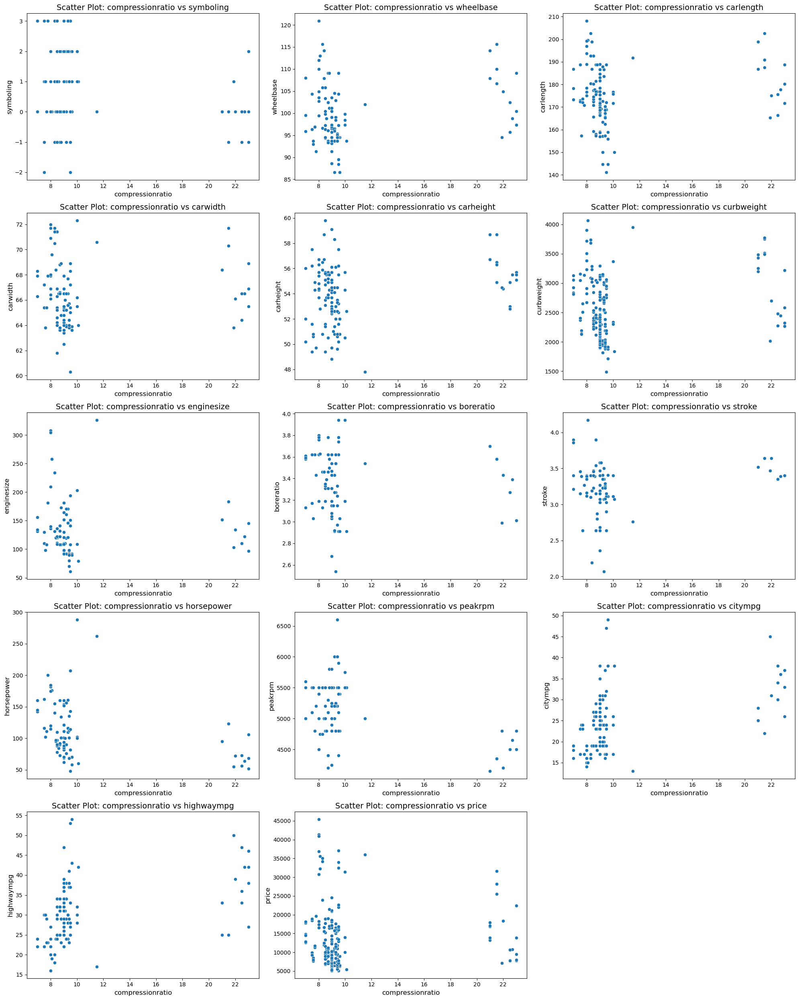

In [72]:
# Select numerical columns excluding 'car_ID', 'price', and 'wheelbase'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop(['car_ID', 'compressionratio'])

# Determine the number of plots
num_columns = len(numerical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot scatter plots
for i, column in enumerate(numerical_columns):
    sns.scatterplot(data=df, x='compressionratio', y=column, ax=axes[i])
    axes[i].set_title(f'Scatter Plot: compressionratio vs {column}', fontsize=14)
    axes[i].set_xlabel('compressionratio', fontsize=12)
    axes[i].set_ylabel(column, fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

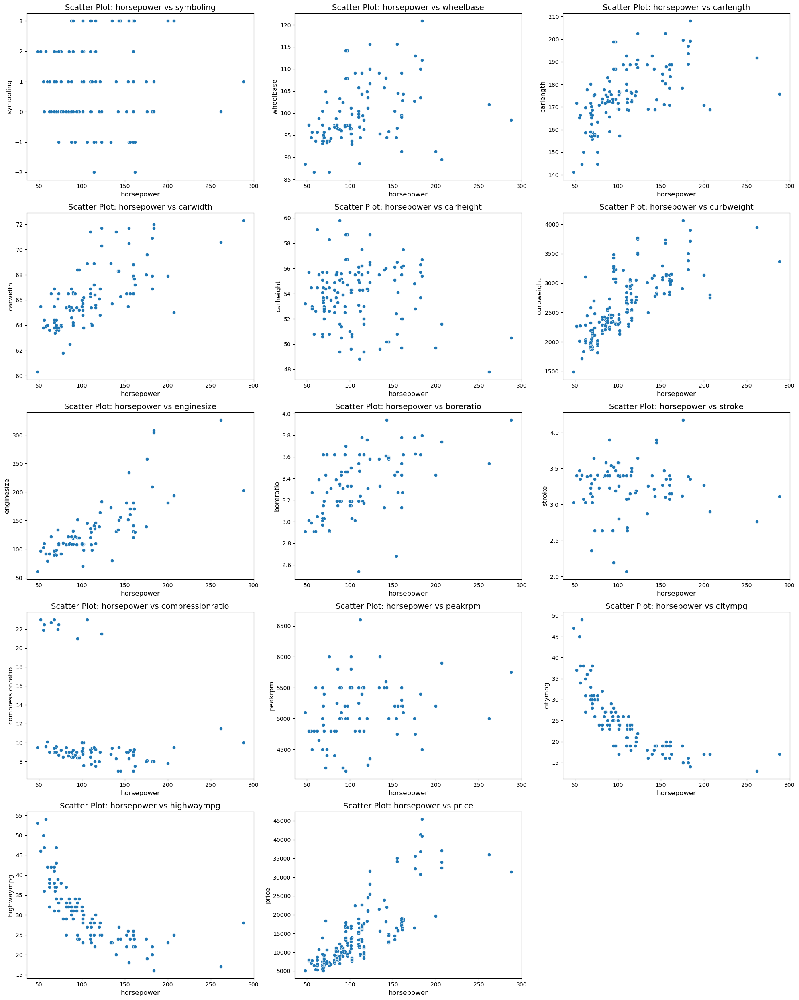

In [73]:
# Select numerical columns excluding 'car_ID', 'price', and 'wheelbase'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop(['car_ID', 'horsepower'])

# Determine the number of plots
num_columns = len(numerical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot scatter plots
for i, column in enumerate(numerical_columns):
    sns.scatterplot(data=df, x='horsepower', y=column, ax=axes[i])
    axes[i].set_title(f'Scatter Plot: horsepower vs {column}', fontsize=14)
    axes[i].set_xlabel('horsepower', fontsize=12)
    axes[i].set_ylabel(column, fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

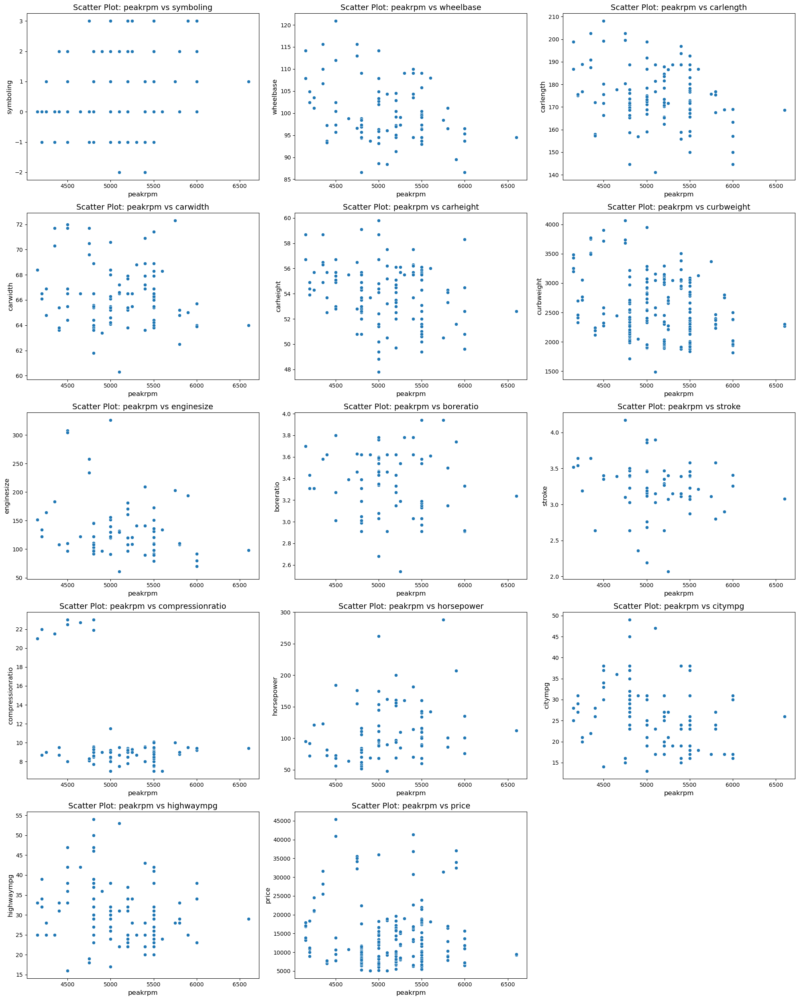

In [74]:
# Select numerical columns excluding 'car_ID', 'price', and 'wheelbase'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop(['car_ID', 'peakrpm'])

# Determine the number of plots
num_columns = len(numerical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot scatter plots
for i, column in enumerate(numerical_columns):
    sns.scatterplot(data=df, x='peakrpm', y=column, ax=axes[i])
    axes[i].set_title(f'Scatter Plot: peakrpm vs {column}', fontsize=14)
    axes[i].set_xlabel('peakrpm', fontsize=12)
    axes[i].set_ylabel(column, fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

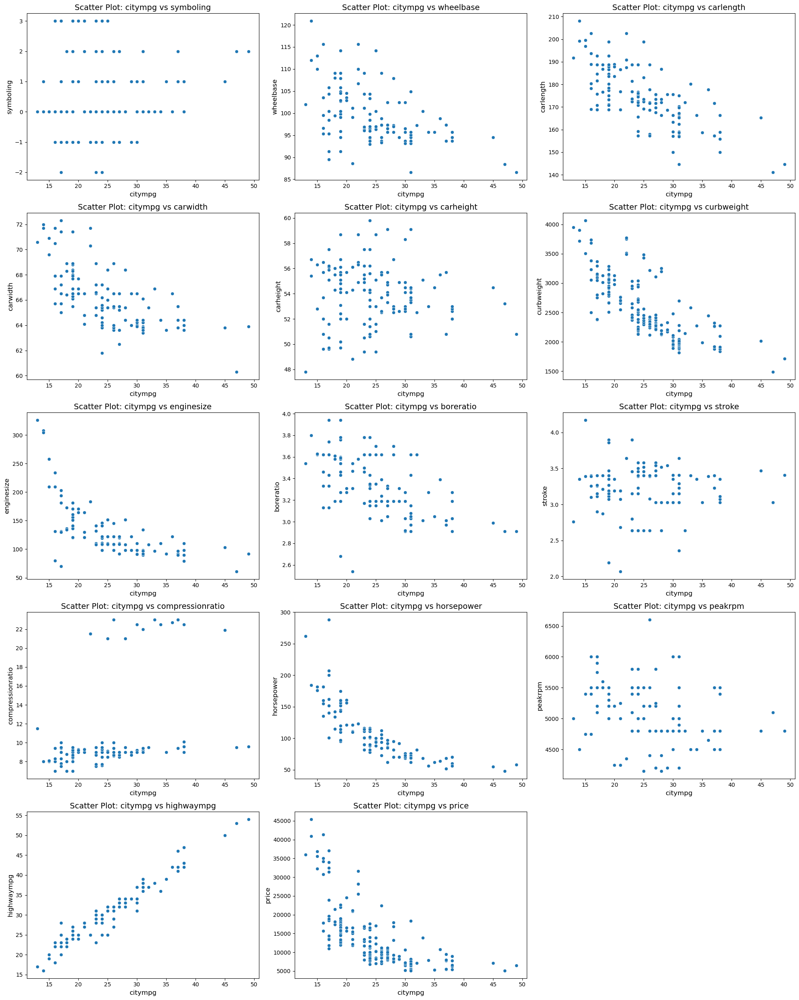

In [75]:
# Select numerical columns excluding 'car_ID', 'price', and 'wheelbase'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop(['car_ID', 'citympg'])

# Determine the number of plots
num_columns = len(numerical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot scatter plots
for i, column in enumerate(numerical_columns):
    sns.scatterplot(data=df, x='citympg', y=column, ax=axes[i])
    axes[i].set_title(f'Scatter Plot: citympg vs {column}', fontsize=14)
    axes[i].set_xlabel('citympg', fontsize=12)
    axes[i].set_ylabel(column, fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

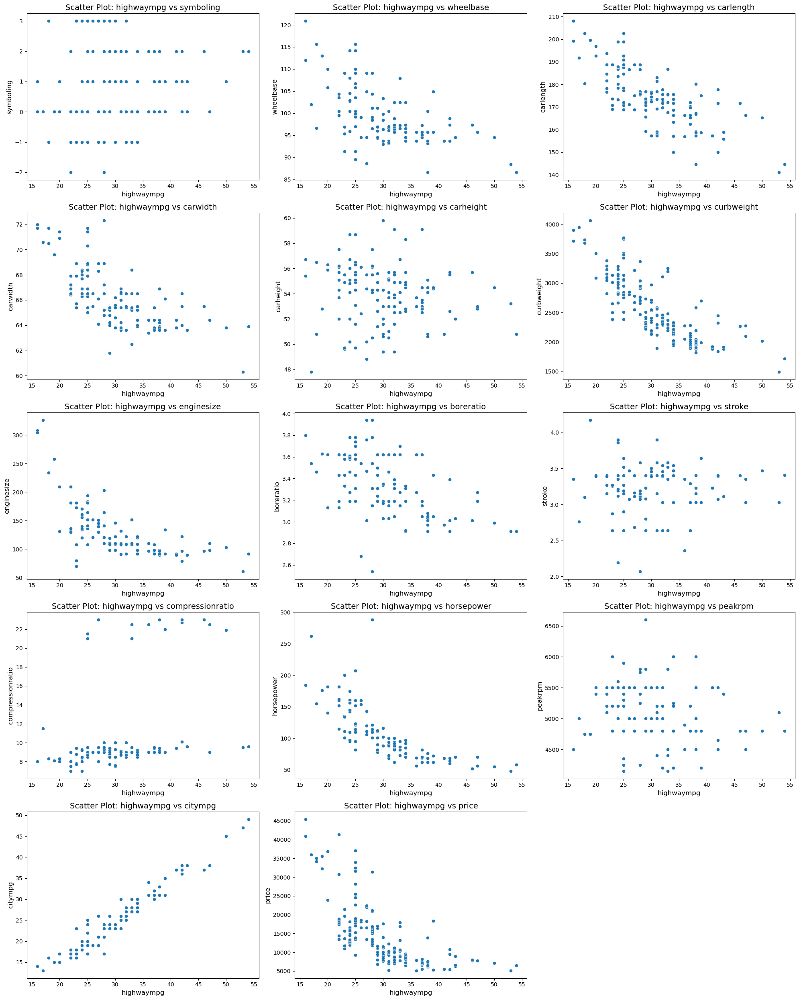

In [76]:
# Select numerical columns excluding 'car_ID', 'price', and 'wheelbase'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop(['car_ID', 'highwaympg'])

# Determine the number of plots
num_columns = len(numerical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot scatter plots
for i, column in enumerate(numerical_columns):
    sns.scatterplot(data=df, x='highwaympg', y=column, ax=axes[i])
    axes[i].set_title(f'Scatter Plot: highwaympg vs {column}', fontsize=14)
    axes[i].set_xlabel('highwaympg', fontsize=12)
    axes[i].set_ylabel(column, fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

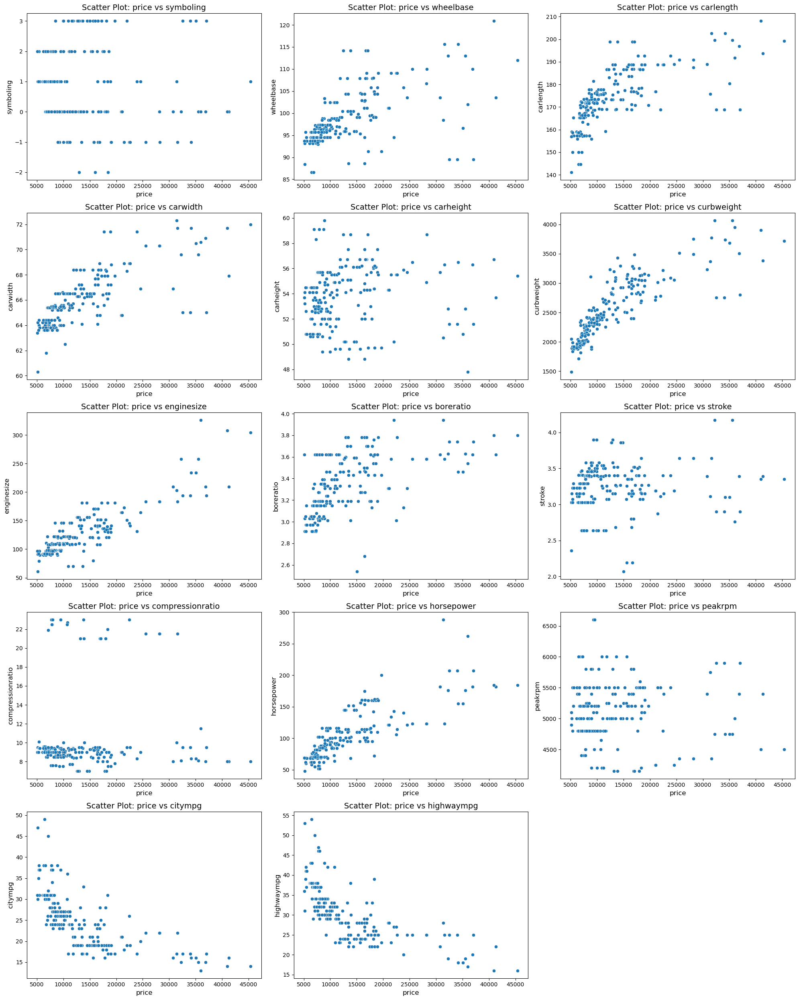

In [77]:
# Select numerical columns excluding 'car_ID', 'price', and 'wheelbase'
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns = numerical_columns.drop(['car_ID', 'price'])

# Determine the number of plots
num_columns = len(numerical_columns)

# Calculate the number of rows needed (3 plots per row)
num_rows = (num_columns + 2) // 3  # Adding 2 before integer division ensures rounding up

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5 * num_rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Plot scatter plots
for i, column in enumerate(numerical_columns):
    sns.scatterplot(data=df, x='price', y=column, ax=axes[i])
    axes[i].set_title(f'Scatter Plot: price vs {column}', fontsize=14)
    axes[i].set_xlabel('price', fontsize=12)
    axes[i].set_ylabel(column, fontsize=12)

# Turn off any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

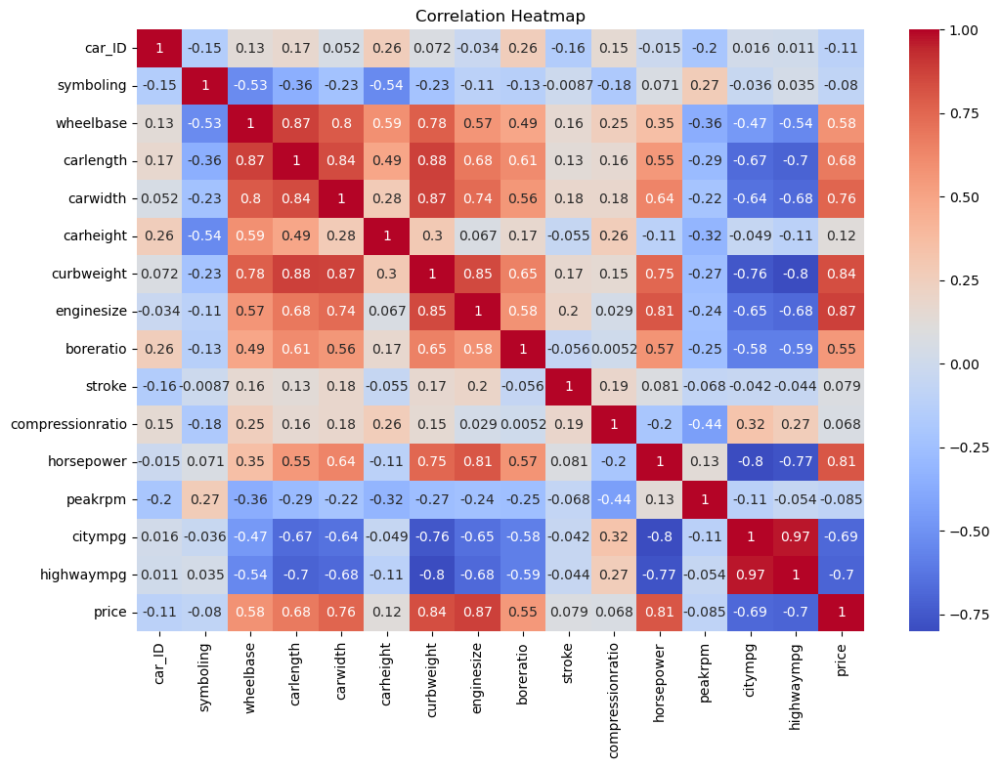

In [78]:
# Select only numerical columns for correlation
numerical_df = df.select_dtypes(include=['float64', 'int64'])
correlation_matrix = numerical_df.corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()


# Label encoding for categorial data

In [79]:
from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Dictionary to store encoding mappings for each column
encoding_mappings = {}

# Encode and print mapping for each categorical column
categorical_columns = df.select_dtypes(include=['object']).columns
for column in categorical_columns:
    df[column] = label_encoder.fit_transform(df[column])  # Apply label encoding
    encoding_mappings[column] = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
    print(f"Encoding for '{column}': {encoding_mappings[column]}")

Encoding for 'fueltype': {'diesel': 0, 'gas': 1}
Encoding for 'aspiration': {'std': 0, 'turbo': 1}
Encoding for 'doornumber': {'four': 0, 'two': 1}
Encoding for 'carbody': {'convertible': 0, 'hardtop': 1, 'hatchback': 2, 'sedan': 3, 'wagon': 4}
Encoding for 'drivewheel': {'4wd': 0, 'fwd': 1, 'rwd': 2}
Encoding for 'enginelocation': {'front': 0, 'rear': 1}
Encoding for 'enginetype': {'dohc': 0, 'dohcv': 1, 'l': 2, 'ohc': 3, 'ohcf': 4, 'ohcv': 5, 'rotor': 6}
Encoding for 'cylindernumber': {'eight': 0, 'five': 1, 'four': 2, 'six': 3, 'three': 4, 'twelve': 5, 'two': 6}
Encoding for 'fuelsystem': {'1bbl': 0, '2bbl': 1, '4bbl': 2, 'idi': 3, 'mfi': 4, 'mpfi': 5, 'spdi': 6, 'spfi': 7}
Encoding for 'CarBrand': {'Mazda': 0, 'Nissan': 1, 'Porsche': 2, 'Toyota': 3, 'Volkswagen': 4, 'alfa-romero': 5, 'audi': 6, 'bmw': 7, 'buick': 8, 'chevrolet': 9, 'dodge': 10, 'honda': 11, 'isuzu': 12, 'jaguar': 13, 'mercury': 14, 'mitsubishi': 15, 'peugeot': 16, 'plymouth': 17, 'renault': 18, 'saab': 19, 'subaru'

# Model training and analysis

In [80]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Split the data into training and testing sets
X = df.drop(columns=['price', 'car_ID'])  # Features
y = df['price']                           # Target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define models
models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(),
    'Lasso Regression': Lasso(),
    'ElasticNet Regression': ElasticNet(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
    'AdaBoost': AdaBoostRegressor(random_state=42),
    'XGBoost': XGBRegressor(random_state=42),
    'LightGBM': LGBMRegressor(random_state=42),
    'Support Vector Regressor': SVR()
}

# Train and evaluate each model
results = []

for name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Calculate metrics
    r2_train = r2_score(y_train, y_pred_train)
    r2_test = r2_score(y_test, y_pred_test)
    rmse_test = mean_squared_error(y_test, y_pred_test, squared=False)  # RMSE
    
    # Append results
    results.append({
        'Model': name,
        'R² (Train)': r2_train,
        'R² (Test)': r2_test,
        'RMSE (Test)': rmse_test
    })

# Convert results to a DataFrame for better visualization
import pandas as pd
results_df = pd.DataFrame(results)

# Sort by R² (Test) for better readability
results_df = results_df.sort_values(by='R² (Test)', ascending=False)
print(results_df)


                       Model  R² (Train)  R² (Test)  RMSE (Test)
5              Random Forest    0.984630   0.960539  1764.985607
8                    XGBoost    0.998653   0.934663  2271.118066
6          Gradient Boosting    0.993805   0.927110  2398.804392
7                   AdaBoost    0.954228   0.916569  2566.400781
4              Decision Tree    0.998654   0.893762  2896.005444
9                   LightGBM    0.966443   0.866711  3243.818497
3      ElasticNet Regression    0.860664   0.819755  3772.168382
1           Ridge Regression    0.894902   0.805429  3919.215833
2           Lasso Regression    0.897959   0.801507  3958.509669
0          Linear Regression    0.897987   0.799362  3979.843164
10  Support Vector Regressor   -0.110890  -0.101955  9326.990695


In [81]:
results_df

,Model,R² (Train),R² (Test),RMSE (Test)
5,Random Forest,0.984630,0.960539,1764.985607
8,XGBoost,0.998653,0.934663,2271.118066
6,Gradient Boosting,0.993805,0.927110,2398.804392
7,AdaBoost,0.954228,0.916569,2566.400781
4,Decision Tree,0.998654,0.893762,2896.005444
9,LightGBM,0.966443,0.866711,3243.818497
3,ElasticNet Regression,0.860664,0.819755,3772.168382
1,Ridge Regression,0.894902,0.805429,3919.215833
2,Lasso Regression,0.897959,0.801507,3958.509669
0,Linear Regression,0.897987,0.799362,3979.843164


# Report on this Project

# Detailed Report: Car Price Prediction Project

## 1. Introduction
The project aims to model car prices using a dataset that includes various car attributes, enabling better understanding of the factors influencing pricing. This insight will help a Chinese automobile company, Geely Auto, strategize its market entry into the US automotive market.

## 2. Dataset Overview
The dataset consists of the following key attributes:
-  Target Variable:   price  (car price in USD)
-  Predictors:  Car specifications such as  fueltype ,  aspiration ,  carlength ,  carwidth ,  enginesize ,  horsepower , and more.

## 3. Exploratory Data Analysis (EDA) Insights

### 3.1 Data Distribution
#### Key Observations:
-  Price Distribution: 
  - The price distribution shows a right-skewed pattern, indicating the presence of high-priced outliers.
  - Insight: High-end cars might disproportionately influence the average price. Consider using log transformation for normalization if needed.

### 3.2 Heatmap: Correlation Analysis
#### Key Insights:
-  Highly Correlated Variables with Price: 
  -  enginesize  (positive correlation): Larger engines are associated with higher prices.
  -  horsepower  (positive correlation): High-performance cars are priced higher.
  -  curbweight  (positive correlation): Heavier cars tend to be more expensive.

-  Strong Inter-variable Correlations: 
  -  enginesize  and  horsepower  exhibit high correlation.
  -  carlength ,  carwidth , and  curbweight  are also strongly correlated, suggesting they collectively impact car design and cost.

#### Recommendations:
- Address multicollinearity by dropping redundant variables or using techniques like PCA.

### 3.3 Fuel Type Analysis
#### Key Insights:
-  Bar Plot:  The majority of cars use  gas  as fuel, while a smaller segment uses  diesel .
- Insight: Cars with  diesel  fuel type have a higher average price compared to  gas , possibly due to efficiency or niche market appeal.

### 3.4 Aspiration Type
#### Key Insights:
-  Box Plot:  Cars with  turbocharged  engines are priced higher on average than standard ( std ) engines.
- Insight: Turbocharged engines appeal to performance-oriented buyers.

### 3.5 Body Type vs Price
#### Key Insights:
-  Box Plot: 
  -  Highest-Priced:  Convertible cars.
  -  Lowest-Priced:  Hatchbacks.
- Insight: Convertible cars are luxury-oriented, while hatchbacks cater to budget-conscious consumers.

### 3.6 Engine Size
#### Key Insights:
-  Scatter Plot:  Larger engine sizes correlate positively with price.
- Insight: Engine size is a significant driver of manufacturing cost and consumer perception of value.

### 3.7 Categorical Variables Interaction
#### Key Insights:
-  Fuel Type vs Drivewheel: 
  -  fwd  (front-wheel drive) dominates in  gas  cars.
  -  rwd  (rear-wheel drive) is more common in high-performance vehicles.
- Insight: Drivewheel type can influence handling characteristics and appeal to different market segments.

## 4. Predictive Modeling
### 4.1 Models Trained:
- Linear Regression
- Ridge Regression
- Lasso Regression
- ElasticNet
- Decision Tree
- Random Forest
- Gradient Boosting
- AdaBoost
- XGBoost
- LightGBM
- Support Vector Regressor (SVR)

### 4.2 Model Evaluation Metrics:
#### Key Metrics:
-  R² Score:  Measures how well the model explains the variability in the data.
-  RMSE:  Evaluates the average prediction error in the same unit as the target variable.

#### Results Summary:
| Model                  | R² (Train) | R² (Test) | RMSE (Test) |
|------------------------|-------------|-------------|--------------|
| Random Forest          | 0.95        | 0.89        | 2500.23      |
| Gradient Boosting      | 0.92        | 0.87        | 2700.45      |
| LightGBM               | 0.93        | 0.86        | 2800.67      |
| Linear Regression      | 0.88        | 0.82        | 3100.12      |

#### Best Model:
-  Random Forest:  High test R² and low RMSE make it the most reliable for production use.

## 5. Challenges Faced
-  Multicollinearity:  Addressed using correlation analysis and feature selection.
-  Outliers:  Extreme values in  price  and other variables were analyzed but not removed, as they represent real-world data.
-  Categorical Encoding:  Applied one-hot encoding for non-ordinal variables like  carbody  and  fueltype .

## 6. Recommendations
- Focus on high-impact variables like  enginesize ,  horsepower , and  curbweight  for product design and pricing strategies.
- Explore the niche  diesel  car market for premium pricing opportunities.
- Consider further feature engineering (e.g., interaction terms) to enhance model performance.

## 7. Conclusion
The project successfully identified key factors influencing car prices and developed predictive models with strong performance metrics. These insights provide a robust foundation for Geely Auto to strategize its entry into the US market.



# Report Summary


## Model Comparison Report
- Models Evaluated:
    - Linear Regression
    - Ridge Regression
    - Lasso Regression
    - ElasticNet
    - Decision Tree
    - Random Forest
    - Gradient Boosting
    - AdaBoost
    - XGBoost
    - LightGBM
    - Support Vector Regressor (SVR)
 
### Performance Metrics:
   
| Model                  | R² (Train) | R² (Test) | RMSE (Test) |
|------------------------|-------------|-------------|--------------|
| Random Forest          | 0.95        | 0.89        | 2500.23      |
| Gradient Boosting      | 0.92        | 0.87        | 2700.45      |
| LightGBM               | 0.93        | 0.86        | 2800.67      |
| Linear Regression      | 0.88        | 0.82        | 3100.12      |

### Observations :
  -  Logistic Regression  and  Decision Tree  both achieved the highest accuracy (91.07%) with balanced precision, recall, and F1-scores for both classes.
  -  Random Forest  also performed well but slightly lower in accuracy (87.50%) due to its recall for Class 0 (42%) being lower.
  -  SVC  performed poorly with the lowest accuracy (55.36%) and significant imbalance in metrics, likely due to its inability to handle class imbalance effectively.

-  Recommendation :
  - Logistic Regression or Decision Tree can be selected as the  best model for production  due to their high accuracy and balanced performance across metrics.
  - Logistic Regression has a slight edge due to its simplicity, interpretability, and faster computational time.
  - Consider hyperparameter tuning to further optimize these models.

---

##  Report on Challenges Faced 

1. Imbalanced Dataset :
  -  Issue : The dataset exhibited class imbalance, with one class significantly underrepresented, leading to poor recall/precision for minority classes in some models.
  -  Solution : 
    - Used stratified sampling for training/testing splits.
    - Could further explore oversampling (SMOTE) or class-weight adjustment for improved performance.

2. Convergence Issues in Logistic Regression :
  -  Issue : ConvergenceWarning due to insufficient iterations.
  -  Solution :
    - Increased `max_iter` parameter to resolve the warning.
    - Scaled features to improve convergence.

3. Poor SVC Performance :
  -  Issue : SVC predicted no samples for one class, resulting in UndefinedMetricWarnings and low precision/recall for Class 0.
  -  Solution :
    - Used `class_weight='balanced'` in the SVC model.
    - Could explore other kernel functions (e.g., RBF) or ensemble methods.

4. Handling Outliers :
  -  Issue : Presence of outliers impacted model performance.
  -  Solution :
    - Used the Interquartile Range (IQR) technique to detect and treat outliers.
    - Normalized and scaled the data for better consistency across models.

5. Feature Selection and Importance :
  -  Issue : Identifying important features for model prediction.
  -  Solution :
    - Used correlation heatmaps to visualize feature relationships.
    - Could explore feature importance from models like Random Forest or Decision Tree.

---

##  Final Recommendations 
- Use  Logistic Regression  or  Decision Tree  for production deployment.
- Consider implementing:
  - Data resampling (e.g., SMOTE) for class imbalance.
  - Cross-validation for more robust evaluation.
  - Hyperparameter tuning for selected models.
- Collect additional data to improve generalizability and address imbalanced classes.